In [1]:
%matplotlib inline
import matplotlib as mpl
import cartopy.feature
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.ticker import AutoMinorLocator, LogLocator
import matplotlib.gridspec as gridspec
import matplotlib.mlab as mlab
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from pathlib import Path
import cartopy.io.shapereader as shpreader
from cartopy.feature import ShapelyFeature
import numpy as np
import pandas as pd
import xarray as xr
from cmcrameri import cm as scm
import scipy.fft as fft
import scipy.signal as signal
import scipy.ndimage as ndimage
from scipy import stats
import cftime
import datetime

# pylaeoclim_leeds v0.0
import pylaeoclim_leeds.hadcm3_processing as hcm3
import pylaeoclim_leeds.zones as zones
import pylaeoclim_leeds.plots as plots
import pylaeoclim_leeds.util_hadcm3 as util

# mw_protocol v0.0
import mw_protocol.plotting as plotting
import mw_protocol.spreading as spreading
import mw_protocol.glac1d_toolbox as tb

# Millennial-scale climate oscillations triggered by deglacial meltwater discharge in last glacial maximum simulations

Supplementary Information

## Global variables

In [2]:
# To modify with your data folder. !This does not include GCM outputs.
home_folder = str(Path.home())
data_folder = f"{home_folder}/work/data/publication/ROME2022_paleoceanography_oscillations"

In [3]:
expts = ['xoupa', 'xoupd', 'xouph', 'tfgbi', 'xoupl', 'xoupf', 'tfgbj']
colors = {'xoupa':'black', 
          'xoupd':'xkcd:bluish green', 'tfgbd':'xkcd:bluish green',
          'xouph':'xkcd:bluey grey', 
          'xoupf':'xkcd:velvet', 
          'tfgbi':'xkcd:bluish',
          'xoupl':'xkcd:burnt orange', 'tfgbr':'xkcd:burnt orange',
          'tfgbj':'xkcd:light orange'}
colors_cold = {'xoupd':plots.scale_lightness('xkcd:royal blue', 0.7), 'xouph':plots.scale_lightness('xkcd:maroon', 0.8), 'tfgbi':plots.scale_lightness('xkcd:rose', 0.7), 'xoupl':plots.scale_lightness('xkcd:grass green', 0.9), 'xoupf':plots.scale_lightness('xkcd:dark orange', 0.9), 'tfgbj':plots.scale_lightness('xkcd:light orange', 0.7)}
colors_warm = {'xoupd':plots.scale_lightness('xkcd:royal blue', 1.2), 'xouph':plots.scale_lightness('xkcd:maroon', 1.05), 'tfgbi':plots.scale_lightness('xkcd:rose', 1.2), 'xoupl':plots.scale_lightness('xkcd:grass green', 1.1), 'xoupf':plots.scale_lightness('xkcd:dark orange', 1.05), 'tfgbj':plots.scale_lightness('xkcd:light orange', 1.2)}
colors_mode = {'Warm':'xkcd:crimson', 'Cold':'xkcd:navy blue'}
colors_method = {'Method 1':'xkcd:magenta', 'Method 1b':'xkcd:olive green', 'Method 2':'xkcd:mustard', 'Method 3':'xkcd:indigo', 'Method 4':'xkcd:pumpkin', 'Method 5':'xkcd:blue green'}
labels = {'xoupa':'CTRL', 'tfgbd':'21.5k', 'xoupd':'21.5k', 'xouph':'21k', 'tfgbi':'20.7k', 'tfgbr':'19.4k', 'xoupl':'19.4k', 'xoupf':'18.2k', 'tfgbj':'17.8k'}
snapshots = {'tfgbd':21.5, 'xoupd':21.5, 'xouph':21, 'tfgbi':20.7, 'tfgbr':19.4, 'xoupl':19.4, 'xoupf':18.2, 'tfgbj':17.8}
start_dates = {'xoupa':-1000, 'tfgbd':0, 'xoupd':0, 'xouph':0, 'tfgbi':0, 'tfgbr':0, 'xoupl':0, 'xoupf':0, 'tfgbj':0}
smooth_date = {'xoupa':3800, 'xoupd':4060-1000, 'xoupf':9900-1000, 'xouph':3650-1000, 'xoupl':9610-1000}

In [4]:
lon_na_min, lon_na_max, lat_na_min, lat_na_max = 290, 370, 45, 80
zone_na = util.cycle_box(lon_na_min, lon_na_max, lat_na_min, lat_na_max)
box_na = zones.Box(lon_na_min, lon_na_max, lat_na_min, lat_na_max, z_min = -1000)
plane_na = zones.Box(lon_na_min, lon_na_max, lat_na_min, lat_na_max)

lon_esp_min, lon_esp_max, lat_esp_min, lat_esp_max = 335, 350, 45, 55
zone_esp = util.cycle_box(lon_esp_min, lon_esp_max, lat_esp_min, lat_esp_max)
box_esp = zones.Box(lon_esp_min, lon_esp_max, lat_esp_min, lat_esp_max, z_min = -1000)
plane_esp = zones.Box(lon_esp_min, lon_esp_max, lat_esp_min, lat_esp_max)

lon_at_min, lon_at_max, lat_at_min, lat_at_max = 290, 370, -20, 80
zone_at = util.cycle_box(lon_at_min, lon_at_max, lat_at_min, lat_at_max)
box_at = zones.Box(lon_at_min, lon_at_max, lat_at_min, lat_at_max, z_min = -1000)
plane_at = zones.Box(lon_at_min, lon_at_max, lat_at_min, lat_at_max)

In [5]:
reader = shpreader.Reader(f"{data_folder}/shapefiles/landmassLGMPolygon2.shp")
lgm = [obj for obj in reader.records()][1]
lgm_feature = ShapelyFeature([lgm.geometry], ccrs.PlateCarree(), facecolor="xkcd:pale", edgecolor='black', lw=0.4)
lgm_coastline = ShapelyFeature([lgm.geometry], ccrs.PlateCarree(), facecolor='none', edgecolor='black', lw=0.5)

## Figures

### Figure 1 - Bathymerty

In [6]:
ds = xr.open_dataset(f"{data_folder}/lgm_inputs/GLAC1DHiceF26.nc").HGLOBH.sel(
    T122KP1=-21.0, method="nearest", drop="True")

values_hice = np.where(ds.values<50, np.NAN, ds.values)
lon_glac, lat_glac = ds.XLONGLOBP5.values, ds.YLATGLOBP25.values

ds = xr.open_dataset(f"{data_folder}/lgm_inputs/xoupaa#pd000003000mr+.nc").ht_mm_srf.isel(
    t=0, drop=True).isel(surface=0, drop=True)
values_oro = np.where(ds.values<1, np.NAN, ds.values)
lon_oro, lat_oro = ds.longitude, ds.latitude

ds = xr.open_dataset(f"{data_folder}/lgm_inputs/xoupao#pg000003000c1+.nc")
values_bathymetry = np.where(util.extract_bathymetry(ds)<11, np.NAN, -util.extract_bathymetry(ds)) # Filtered shallow points
lon_ocn, lat_ocn = ds.longitude, ds.latitude

__ Initialising the norm from vmin and vmax values
__ Initialising the norm from vmin and vmax values


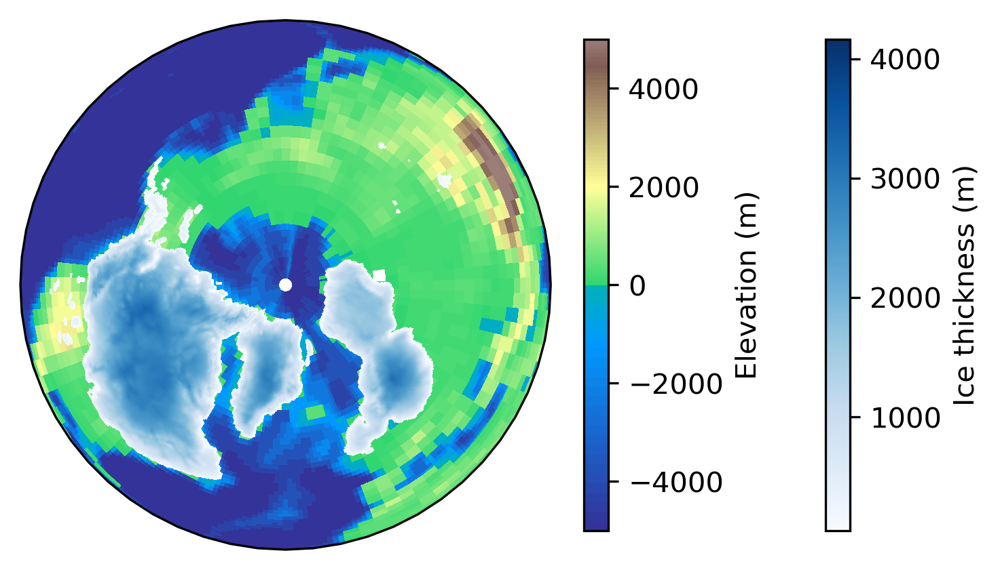

In [7]:
bathymetry = plt.get_cmap('terrain', 128)(np.linspace(0, 0.2, 256))
elevation = plt.get_cmap('terrain', 128)(np.linspace(0.3, 0.8, 256))

newcmp = mpl.colors.ListedColormap(np.vstack((bathymetry, elevation)), name='terrain_centered')
mymap = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', np.vstack((bathymetry, elevation)),)

norm_oro = plots.Normalize(vmin=0, vmax=5000)
norm_ocn = plots.Normalize(vmin=-5000, vmax=0)
norm = mpl.colors.TwoSlopeNorm(vmin=-5000, vcenter=0, vmax=5000)


projection_map = ccrs.NearsidePerspective(central_longitude=-30.0, central_latitude=90.0, satellite_height=30000000)
figMap, axMap = plt.subplots(nrows=1, ncols=1, subplot_kw={'projection':projection_map}, figsize=(6,4), dpi=300)

cb_bathymetry = axMap.pcolormesh(lon_ocn, lat_ocn, values_bathymetry, cmap=mpl.colors.ListedColormap(bathymetry), 
                                 norm=norm_ocn, transform=ccrs.PlateCarree())
cb_oro = axMap.pcolormesh(lon_oro, lat_oro, values_oro, cmap=mpl.colors.ListedColormap(elevation),
                          norm=norm_oro, transform=ccrs.PlateCarree())
cb_ice = axMap.pcolormesh(lon_glac, lat_glac, values_hice, transform=ccrs.PlateCarree(),cmap="Blues")
axMap.set_global()

figMap.colorbar(mappable=cb_ice, ax=axMap, label="Ice thickness (m)", orientation="vertical", shrink = 0.8, pad=0.15)
figMap.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=mymap), ax=axMap, label='Elevation (m)', orientation='vertical', shrink = 0.8)

In [8]:
# figMap.savefig('Figures/boundary.pdf', bbox_inches='tight', format='pdf')

### Figure S2 - Drift

In [9]:
spans = {'start_smooth':4900, 'end_smooth':4999, 'start_raw':3000, 'end_raw':3100}

In [10]:
amoc, sst, sss, sat = {}, {}, {}, {}
amoc['xoupa'] = hcm3.MERIDATS('xoupa', chunks=10).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
sat['xoupa'] = hcm3.SATATS('xoupa', chunks=10).sat(mode_lon="weighted_mean", mode_lat="weighted_mean")
sst['xoupa'] = hcm3.SSTATS('xoupa', chunks=10).sst(mode_lon="weighted_mean", mode_lat="weighted_mean")
sss['xoupa'] = hcm3.SAL01ATS('xoupa', chunks=10).salinity(mode_lon="weighted_mean", mode_lat="weighted_mean")

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: weighted_mean
____ Processing latitude: weighted_mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SST.
____ Coordinates imported in the GeoDataArray instance

/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: weighted_mean
____ Processing latitude: weighted_mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [11]:
lreg_amoc_spin = stats.linregress(amoc['xoupa'].processed_time(-1000)[:1000], util.rmean(amoc['xoupa'].values()[:1000],30))
lreg_amoc_raw = stats.linregress(amoc['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], util.rmean(amoc['xoupa'].values()[1000:smooth_date['xoupa']],30))
lreg_amoc_smooth = stats.linregress(amoc['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(amoc['xoupa'].values()[smooth_date['xoupa']:],30))

lreg_sat_spin = stats.linregress(sat['xoupa'].processed_time(-1000)[:1000], util.rmean(sat['xoupa'].values()[:1000],30))
lreg_sat_raw = stats.linregress(sat['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], util.rmean(sat['xoupa'].values()[1000:smooth_date['xoupa']],30))
lreg_sat_smooth = stats.linregress(sat['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sat['xoupa'].values()[smooth_date['xoupa']:],30))

lreg_sst_spin = stats.linregress(sst['xoupa'].processed_time(-1000)[:1000], util.rmean(sst['xoupa'].values()[:1000],30))
lreg_sst_raw = stats.linregress(sst['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], util.rmean(sst['xoupa'].values()[1000:smooth_date['xoupa']],30))
lreg_sst_smooth = stats.linregress(sst['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sst['xoupa'].values()[smooth_date['xoupa']:],30))

lreg_sss_spin = stats.linregress(sss['xoupa'].processed_time(-1000)[:1000], util.rmean(sss['xoupa'].values()[:1000],30))
lreg_sss_raw = stats.linregress(sss['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], util.rmean(sss['xoupa'].values()[1000:smooth_date['xoupa']],30))
lreg_sss_smooth = stats.linregress(sss['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sss['xoupa'].values()[smooth_date['xoupa']:],30))

Text(0.01, 0.85, 'd')

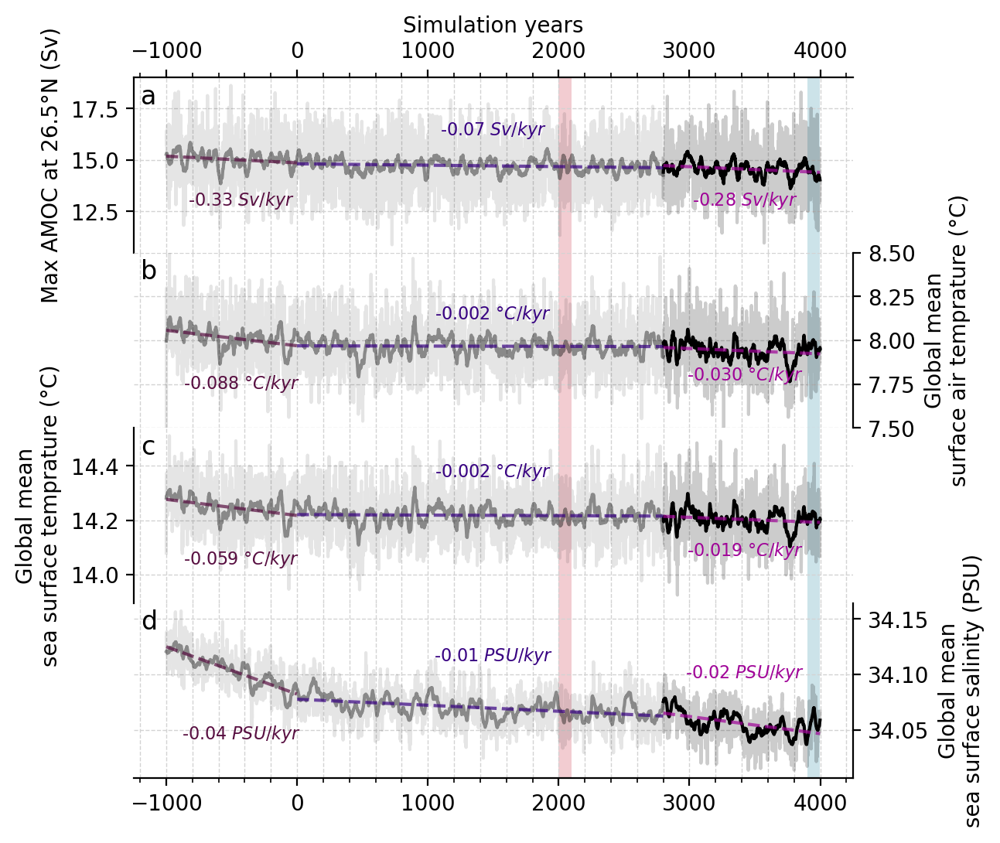

In [12]:
figMap = plt.figure(figsize=(6, 6), dpi=200)

gs = gridspec.GridSpec(nrows=4, ncols=1, hspace=0)
axAMOC = figMap.add_subplot(gs[0],facecolor='None')
axSAT = figMap.add_subplot(gs[1],facecolor='None', sharex=axAMOC)
axSST = figMap.add_subplot(gs[2],facecolor='None', sharex=axAMOC)
axSSS = figMap.add_subplot(gs[3],facecolor='None', sharex=axAMOC)

axAMOC.plot(amoc['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], amoc['xoupa'].values()[:smooth_date['xoupa']], color="xkcd:black", linestyle="-", alpha=0.1)
axAMOC.plot(amoc['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], amoc['xoupa'].values()[smooth_date['xoupa']:], color="xkcd:black", linestyle="-", alpha=0.2)
axAMOC.plot(amoc['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], util.rmean(amoc['xoupa'].values()[:smooth_date['xoupa']], 30), alpha=0.4, color="xkcd:black", linestyle="-")
axAMOC.plot(amoc['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(amoc['xoupa'].values()[smooth_date['xoupa']:], 30), alpha=1, color="xkcd:black", linestyle="-")

axAMOC.plot(amoc['xoupa'].processed_time(-1000)[:1000], 
            [lreg_amoc_spin[0]*i + lreg_amoc_spin[1] for i in amoc['xoupa'].processed_time(-1000)[:1000]], alpha=0.7, color='xkcd:plum', linestyle="--")
axAMOC.annotate(fr"{lreg_amoc_spin[0]*1000:.2f} $Sv/kyr$",
                xy=(0.15, 0.3), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:plum")
axAMOC.plot(amoc['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], 
            [lreg_amoc_raw[0]*i + lreg_amoc_raw[1] for i in amoc['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']]], alpha=0.7, color='xkcd:indigo', linestyle="--")
axAMOC.annotate(fr"{lreg_amoc_raw[0]*1000:.2f} $Sv/kyr$",
                xy=(0.5, 0.7), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:indigo")
axAMOC.plot(amoc['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], 
            [lreg_amoc_smooth[0]*i + lreg_amoc_smooth[1] for i in amoc['xoupa'].processed_time(-1000)[smooth_date['xoupa']:]], alpha=0.7, color='xkcd:barney purple', linestyle="--")
axAMOC.annotate(fr"{lreg_amoc_smooth[0]*1000:.2f} $Sv/kyr$",
                xy=(0.85, 0.3), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:barney purple")

axAMOC.axvspan(spans['start_smooth']-1000, spans['end_smooth']-1000, color='xkcd:sea blue', linewidth=0, alpha=0.2)
axAMOC.axvspan(spans['start_raw']-1000, spans['end_raw']-1000, color='xkcd:scarlet', linewidth=0, alpha=0.2)
axAMOC.set_ylabel('Max AMOC at 26.5°N (Sv)')
axAMOC.set_xlabel('Simulation years')
axAMOC.spines['right'].set_visible(False)
axAMOC.spines['bottom'].set_visible(False)
axAMOC.yaxis.set_ticks_position('left')
axAMOC.yaxis.set_label_position('left')
axAMOC.xaxis.set_ticks_position('top')
axAMOC.xaxis.set_label_position('top')
axAMOC.xaxis.set_minor_locator(AutoMinorLocator())
axAMOC.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)


axSAT.plot(sat['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], sat['xoupa'].values()[:smooth_date['xoupa']], color="xkcd:black", linestyle="-", alpha=0.1)
axSAT.plot(sat['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], sat['xoupa'].values()[smooth_date['xoupa']:], color="xkcd:black", linestyle="-", alpha=0.2)
axSAT.plot(sat['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], util.rmean(sat['xoupa'].values()[:smooth_date['xoupa']], 30), alpha=0.4, color="xkcd:black", linestyle="-")
axSAT.plot(sat['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sat['xoupa'].values()[smooth_date['xoupa']:], 30), alpha=1, color="xkcd:black", linestyle="-")

axSAT.plot(sat['xoupa'].processed_time(-1000)[:1000], 
            [lreg_sat_spin[0]*i + lreg_sat_spin[1] for i in sat['xoupa'].processed_time(-1000)[:1000]], alpha=0.7, color='xkcd:plum', linestyle="--")
axSAT.annotate(fr"{lreg_sat_spin[0]*1000:.3f} $°C/kyr$",
                xy=(0.15, 0.25), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:plum")
axSAT.plot(sat['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], 
            [lreg_sat_raw[0]*i + lreg_sat_raw[1] for i in sat['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']]], alpha=0.7, color='xkcd:indigo', linestyle="--")
axSAT.annotate(fr"{lreg_sat_raw[0]*1000:.3f} $°C/kyr$",
                xy=(0.5, 0.65), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:indigo")
axSAT.plot(sat['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], 
            [lreg_sat_smooth[0]*i + lreg_sat_smooth[1] for i in sat['xoupa'].processed_time(-1000)[smooth_date['xoupa']:]], alpha=0.7, color='xkcd:barney purple', linestyle="--")
axSAT.annotate(fr"{lreg_sat_smooth[0]*1000:.3f} $°C/kyr$",
                xy=(0.85, 0.3), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:barney purple")

axSAT.axvspan(spans['start_smooth']-1000, spans['end_smooth']-1000, color='xkcd:sea blue', linewidth=0, alpha=0.2)
axSAT.axvspan(spans['start_raw']-1000, spans['end_raw']-1000, color='xkcd:scarlet', linewidth=0, alpha=0.2)
axSAT.set_ylabel('Global mean\nsurface air temprature (°C)')
axSAT.spines['left'].set_visible(False)
axSAT.spines['bottom'].set_visible(False)
axSAT.spines['top'].set_visible(False)
axSAT.yaxis.set_ticks_position('right')
axSAT.yaxis.set_label_position('right')
axSAT.set_ylim([7.5,8.5])
axSAT.tick_params(axis='x', colors='None', which='both')
axSAT.xaxis.set_minor_locator(AutoMinorLocator())
axSAT.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axSST.plot(sst['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], sst['xoupa'].values()[:smooth_date['xoupa']], color="xkcd:black", linestyle="-", alpha=0.1)
axSST.plot(sst['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], sst['xoupa'].values()[smooth_date['xoupa']:], color="xkcd:black", linestyle="-", alpha=0.2)
axSST.plot(sst['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], util.rmean(sst['xoupa'].values()[:smooth_date['xoupa']], 30), alpha=0.4, color="xkcd:black", linestyle="-")
axSST.plot(sst['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sst['xoupa'].values()[smooth_date['xoupa']:], 30), alpha=1, color="xkcd:black", linestyle="-")
axSST.axvspan(spans['start_smooth']-1000, spans['end_smooth']-1000, color='xkcd:sea blue', linewidth=0, alpha=0.2)
axSST.axvspan(spans['start_raw']-1000, spans['end_raw']-1000, color='xkcd:scarlet', linewidth=0, alpha=0.2)

axSST.plot(sst['xoupa'].processed_time(-1000)[:1000], 
            [lreg_sst_spin[0]*i + lreg_sst_spin[1] for i in sst['xoupa'].processed_time(-1000)[:1000]], alpha=0.7, color='xkcd:plum', linestyle="--")
axSST.annotate(fr"{lreg_sst_spin[0]*1000:.3f} $°C/kyr$",
                xy=(0.15, 0.25), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:plum")
axSST.plot(sst['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], 
            [lreg_sst_raw[0]*i + lreg_sst_raw[1] for i in sst['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']]], alpha=0.7, color='xkcd:indigo', linestyle="--")
axSST.annotate(fr"{lreg_sst_raw[0]*1000:.3f} $°C/kyr$",
                xy=(0.5, 0.75), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:indigo")
axSST.plot(sst['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], 
            [lreg_sst_smooth[0]*i + lreg_sst_smooth[1] for i in sst['xoupa'].processed_time(-1000)[smooth_date['xoupa']:]], alpha=0.7, color='xkcd:barney purple', linestyle="--")
axSST.annotate(fr"{lreg_sst_smooth[0]*1000:.3f} $°C/kyr$",
                xy=(0.85, 0.3), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:barney purple")

axSST.set_ylabel('Global mean\nsea surface temprature (°C)')
axSST.spines['right'].set_visible(False)
axSST.spines['bottom'].set_visible(False)
axSST.spines['top'].set_visible(False)
axSST.yaxis.set_ticks_position('left')
axSST.yaxis.set_label_position('left')
axSST.tick_params(axis='x', colors='None', which='both')
axSST.xaxis.set_minor_locator(AutoMinorLocator())
axSST.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axSSS.plot(sss['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], sss['xoupa'].values()[:smooth_date['xoupa']], color="xkcd:black", linestyle="-", alpha=0.1)
axSSS.plot(sss['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], sss['xoupa'].values()[smooth_date['xoupa']:], color="xkcd:black", linestyle="-", alpha=0.2)
axSSS.plot(sss['xoupa'].processed_time(-1000)[:smooth_date['xoupa']], util.rmean(sss['xoupa'].values()[:smooth_date['xoupa']], 30), alpha=0.4, color="xkcd:black", linestyle="-")
axSSS.plot(sss['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], util.rmean(sss['xoupa'].values()[smooth_date['xoupa']:], 30), alpha=1, color="xkcd:black", linestyle="-")

axSSS.plot(sss['xoupa'].processed_time(-1000)[:1000], 
            [lreg_sss_spin[0]*i + lreg_sss_spin[1] for i in sss['xoupa'].processed_time(-1000)[:1000]], alpha=0.7, color='xkcd:plum', linestyle="--")
axSSS.annotate(fr"{lreg_sss_spin[0]*1000:.2f} $PSU/kyr$",
                xy=(0.15, 0.25), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:plum")
axSSS.plot(sss['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']], 
            [lreg_sss_raw[0]*i + lreg_sss_raw[1] for i in sss['xoupa'].processed_time(-1000)[1000:smooth_date['xoupa']]], alpha=0.7, color='xkcd:indigo', linestyle="--")
axSSS.annotate(fr"{lreg_sss_raw[0]*1000:.2f} $PSU/kyr$",
                xy=(0.5, 0.7), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:indigo")
axSSS.plot(sss['xoupa'].processed_time(-1000)[smooth_date['xoupa']:], 
            [lreg_sss_smooth[0]*i + lreg_sss_smooth[1] for i in sss['xoupa'].processed_time(-1000)[smooth_date['xoupa']:]], alpha=0.7, color='xkcd:barney purple', linestyle="--")
axSSS.annotate(fr"{lreg_sss_smooth[0]*1000:.2f} $PSU/kyr$",
                xy=(0.85, 0.6), ha='center', va='center', xycoords='axes fraction', rotation=0, size=8, color="xkcd:barney purple")

axSSS.axvspan(spans['start_smooth']-1000, spans['end_smooth']-1000, color='xkcd:sea blue', linewidth=0, alpha=0.2)
axSSS.axvspan(spans['start_raw']-1000, spans['end_raw']-1000, color='xkcd:scarlet', linewidth=0, alpha=0.2)
axSSS.set_ylabel('Global mean\nsea surface salinity (PSU)')
axSSS.spines['left'].set_visible(False)
axSSS.spines['top'].set_visible(False)
axSSS.yaxis.set_ticks_position('right')
axSSS.yaxis.set_label_position('right')
axSSS.xaxis.set_minor_locator(AutoMinorLocator())
axSSS.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axAMOC.annotate('a', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axSAT.annotate('b', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axSST.annotate('c', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axSSS.annotate('d', xy=(0.01,0.85), xycoords='axes fraction', size=12)

In [13]:
# figMap.savefig('Figures/drift.pdf', bbox_inches='tight', format='pdf')

### Figure S3 - CTRL summary Souther Ocean

In [14]:
start_ctrl, end_ctrl = 4900, 4999
zone_sh = zones.Box(lat_max=-10)

ts = hcm3.SATATS("xoupa", start_ctrl, end_ctrl, chunks=100)
sat_ctrl = ts.sat(mode_t="mean", zone=zone_sh)
lon_at, lat_at = sat_ctrl.lon_p, sat_ctrl.lat_p[:-1]

ts = hcm3.MLDATS("xoupa", start_ctrl, end_ctrl, chunks=100)
mld_ctrl = ts.mld(mode_t="mean", zone=zone_sh)
mld_values = mld_ctrl.values()
mld_values[-1] = mld_values[-2]
ts = hcm3.SSTATS("xoupa", start_ctrl, end_ctrl, chunks=100)
sst_ctrl = ts.sst(mode_t="mean", zone=zone_sh)
sst_values = sst_ctrl.values()
lon_ocn, lat_ocn = mld_ctrl.lon_p, mld_ctrl.lat_p[:-1]

ts = hcm3.WICEATS("xoupa", start_ctrl, end_ctrl, chunks=100)
wice_ctrl = ts.ice_conc(mode_t="mean")
ts = hcm3.SICEATS("xoupa", start_ctrl, end_ctrl, chunks=100)
sice_ctrl = ts.ice_conc(mode_t="mean")
lon_ice, lat_ice = wice_ctrl.lon_p, wice_ctrl.lat_p

ts = hcm3.MERIDATS("xoupa", start_ctrl, end_ctrl, chunks=100)
amoc_ctrl = ts.atlantic(zone=zones.Box(lat_max=10), mode_t="mean")
lat_moc, z_moc = amoc_ctrl.lat[:-1], amoc_ctrl.z_p

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SST.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'>

/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


Text(-0.3, 0.95, 'd')

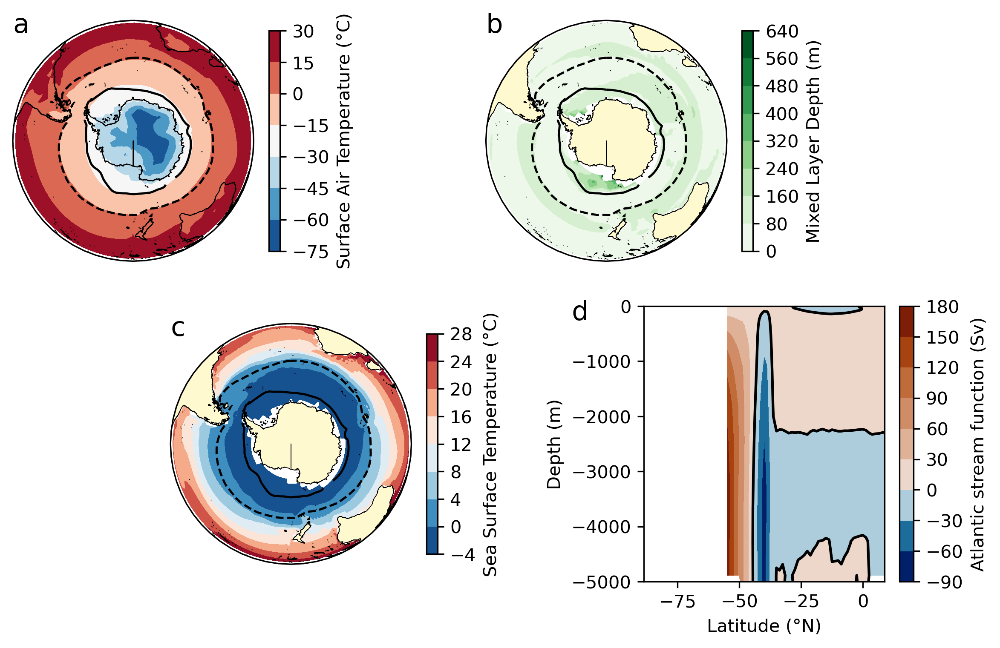

In [15]:
figMap = plt.figure(figsize=(11,6), dpi=300)
projection_map = ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90.0, satellite_height=1000000000)

gs = gridspec.GridSpec(nrows=2, ncols=7, wspace=0.1, hspace=0.1)
axSAT = figMap.add_subplot(gs[0,0:2], projection = projection_map)
axMLD = figMap.add_subplot(gs[0,3:5], projection = projection_map)
axSST = figMap.add_subplot(gs[1,1:3], projection = projection_map)
axAMOC = figMap.add_subplot(gs[1,4:6])

# SAT

cmSAT = axSAT.contourf(lon_at, lat_at, sat_ctrl.values(), transform=ccrs.PlateCarree(), cmap="RdBu_r")
axSAT.contour(lon_ice, lat_ice, wice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='-')
axSAT.contour(lon_ice, lat_ice, sice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='--')
axSAT.set_global()
axSAT.add_feature(lgm_coastline, zorder=1)

figMap.colorbar(mappable=cmSAT, ax=axSAT, label="Surface Air Temperature (°C)", shrink=0.8)

# SST

cmSST = axSST.contourf(lon_ocn, lat_ocn, sst_values, transform=ccrs.PlateCarree(), cmap="RdBu_r")
axSST.contour(lon_ice, lat_ice, wice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='-')
axSST.contour(lon_ice, lat_ice, sice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='--')
axSST.set_global()
axSST.add_feature(lgm_feature, zorder=1)
figMap.colorbar(mappable=cmSST, ax=axSST, label="Sea Surface Temperature (°C)", shrink=0.8)

# MLD

cmMLD = axMLD.contourf(lon_ocn, lat_ocn, mld_values, transform=ccrs.PlateCarree(), cmap="Greens")
axMLD.contour(lon_ice, lat_ice, wice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='-')
axMLD.contour(lon_ice, lat_ice, sice_ctrl.values(), transform=ccrs.PlateCarree(), levels=[0.5], colors='black',
              linewidths=1.2, linestyles='--')
axMLD.set_global()
axMLD.add_feature(lgm_feature, zorder=1)
figMap.colorbar(mappable=cmMLD, ax=axMLD, label="Mixed Layer Depth (m)", shrink=0.8)

# AMOC
norm = matplotlib.colors.TwoSlopeNorm(vmin=-80, vcenter=0, vmax=200)
cmAMOC = axAMOC.contourf(lat_moc, z_moc, amoc_ctrl.values(), cmap=scm.vik, norm=norm, levels=8)
axAMOC.contour(lat_moc, z_moc, amoc_ctrl.values(), levels=[0], colors='black')
axAMOC.set_xlabel("Latitude (°N)")
axAMOC.set_ylabel("Depth (m)")
axAMOC.set_ylim([-5000,0])
figMap.colorbar(mappable=cmAMOC, ax=axAMOC, label="Atlantic stream function (Sv)")

axSAT.annotate('a', xy=(0, 0.95), xycoords='axes fraction', size=15)
axMLD.annotate('b', xy=(0, 0.95), xycoords='axes fraction', size=15)
axSST.annotate('c', xy=(0, 0.95), xycoords='axes fraction', size=15)
axAMOC.annotate('d', xy=(-0.3, 0.95), xycoords='axes fraction', size=15)

In [16]:
# figMap.savefig('Figures/control_so.pdf', bbox_inches='tight', format='pdf')

### Figure S4 - Zoom-in on frequency analysis

In [17]:
ngrip = {}

for expt in ['tfgbi', 'xoupf', 'tfgbj', 'xouph']:
    ngrip[expt] = hcm3.SATATS(expt, chunks=10).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)
ngrip['tfgbr'] = hcm3.SATATS('tfgbr', end_year=3999, chunks=10).concat(
    hcm3.SATATS('xoupl', chunks=10)).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)
ngrip['xoupd'] = hcm3.SATATS('tfgbd', end_year=4060, chunks=10).concat(
    hcm3.SATATS('xoupd', chunks=10)).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbi between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ New longitude value : 318.75
____ New latitude value : 75.0
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupf between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ New longitude value : 318.75
____ New latitude value : 75.0
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ New longitude value : 318.75
____ N

In [18]:
filt, psd, fq, harm, fc, ngripf, ngripf_u = {}, {}, {}, {}, {}, {}, {}

filt_u = util.ButterLowPass(order=1, fc=2*10**-3, fs=1, mult=2)

for expt in ['tfgbi', 'tfgbr', 'xoupf', 'tfgbj', 'xoupd', 'xouph']:
    psd[expt], fq[expt] = util.psd(ngrip[expt].values(), fs=1, scale_by_freq=True)
    harm[expt] = np.where(fq[expt]<=10**-1)
    fc[expt] = util.fundamental_fq(psd[expt], fq[expt])
    filt[expt] = util.ButterLowPass(order=1, fc=fc[expt], fs=1, mult=3)
    
    ngripf[expt] = filt[expt].process(ngrip[expt].values())    
    ngripf_u[expt] = filt_u.process(ngrip[expt].values())

Text(0.01, 0.85, 'b')

<ipython-input-19-173d3949c957>:19: RuntimeWarning: divide by zero encountered in true_divide
  axZoom.secondary_xaxis('top', functions=(lambda a : 1/a, lambda a : 1/a)).set_xlabel('Periodicity (yrs)')


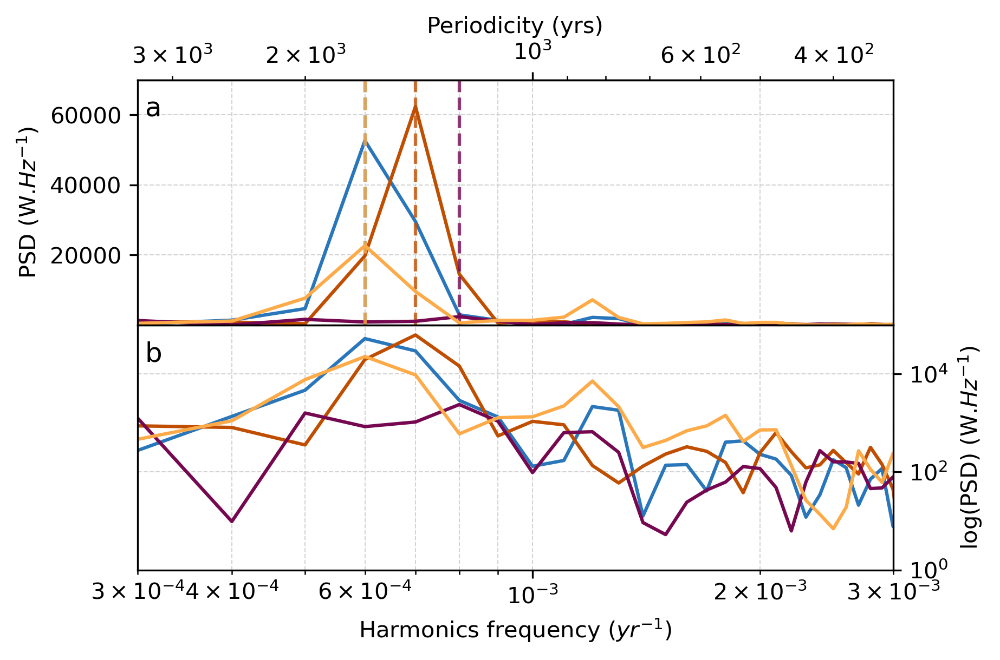

In [19]:
figMap = plt.figure(figsize=(6,4), dpi=300)

gs = gridspec.GridSpec(nrows=2, ncols=1, hspace=0)
axZoom = figMap.add_subplot(gs[0],facecolor='None')
axZoomLog = figMap.add_subplot(gs[1],facecolor='None', sharex=axZoom)


for expt in ['tfgbi', 'tfgbr', 'xoupf', 'tfgbj']:
    axZoom.semilogx(fq[expt][harm[expt]], psd[expt][harm[expt]], color=colors[expt])
    axZoom.axvline(fc[expt], linestyle='--', color=colors[expt], alpha=0.8)
    axZoomLog.loglog(fq[expt][harm[expt]][:100], psd[expt][harm[expt]][:100], color=colors[expt])

axZoom.set_ylabel(r"PSD (W.$Hz^{-1}$)")
axZoom.axes.xaxis.set_visible(True)
axZoom.grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
axZoom.set_xlim([3*10**-4, 3*10**-3])
axZoom.set_ylim([1, 7*10**4])
axZoom.tick_params(axis='x', colors='None', which='both')
axZoom.secondary_xaxis('top', functions=(lambda a : 1/a, lambda a : 1/a)).set_xlabel('Periodicity (yrs)')

axZoomLog.set_ylabel(r"log(PSD) (W.$Hz^{-1}$)")
axZoomLog.yaxis.set_ticks_position('right')
axZoomLog.yaxis.set_label_position('right')
axZoomLog.grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
axZoomLog.set_xlabel(r"Harmonics frequency ($yr^{-1}$)")
axZoomLog.set_ylim([1, 10**5])

axZoom.annotate('a', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axZoomLog.annotate('b', xy=(0.01,0.85), xycoords='axes fraction', size=12)

In [20]:
# figMap.savefig('Figures/fq_analysis_zoom.pdf', bbox_inches='tight', format='pdf')

### Figure S5 - Convection during warm modes

In [21]:
lon_at_min, lon_at_max, lat_at_min, lat_at_max = 290, 370, -20, 80
zone_at = util.cycle_box(lon_at_min, lon_at_max, lat_at_min, lat_at_max)
box_at = zones.Box(lon_at_min, lon_at_max, lat_at_min, lat_at_max, z_min = -1000)
plane_at = zones.Box(lon_at_min, lon_at_max, lat_at_min, lat_at_max)

clim = {'xoupd':14, 'xouph':12, 'tfgbi':8, 'tfgbj':8, 'xoupl':8, 'xoupf':8}
wlim = {'xoupd':14.5, 'xouph':14.5, 'tfgbi':15, 'tfgbj':15, 'xoupl':16, 'xoupf':13.5}

In [23]:
mld_ref = hcm3.MLDATS('xoupa', chunks=10).mld(mode_t='mean', zone=zones.Box(lat_min=-20)).values()
sss_ref = hcm3.SAL01ATS('xoupa', chunks=10).salinity(mode_t='mean', zone=zones.Box(lat_min=-20)).values()

amocv, amocts, amocv, amocts_mode, idxes = {}, {}, {}, {}, {}
sss, mld = {}, {}
sss_mode, mld_mode = {}, {}

for mode in ['cold', 'warm']:
    sss_mode[mode], mld_mode[mode] = {}, {}
    idxes[mode] = {}
    amocts_mode[mode] = {}
    
for expt in ['tfgbi', 'xoupl', 'tfgbj', 'xoupd', 'xouph', 'xoupf']:

    # Calculate AMOC Index Time series
    
    if expt == 'xoupl':
        amocts[expt] = hcm3.MERIDATS('tfgbr', end_year=3999, chunks=10).concat(
            hcm3.MERIDATS('xoupl', chunks=10)).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    elif expt == 'xoupd':
        amocts[expt] = hcm3.MERIDATS('tfgbd', end_year=4060, chunks=10).concat(
            hcm3.MERIDATS('xoupd', chunks=10)).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    else:
        amocts[expt] = hcm3.MERIDATS(expt, chunks=10).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    amocv[expt] = util.running_mean(amocts[expt].values(), 30)
    idxes['cold'][expt] = np.where(amocv[expt]<=clim[expt])
    idxes['warm'][expt] = np.where(amocv[expt]>=wlim[expt])
    
    if expt == 'xoupl':
        sss[expt] = hcm3.SAL01ATS('tfgbr', end_year=3999, chunks=10).concat(
            hcm3.SAL01ATS('xoupl', chunks=10)).salinity(zone=zones.Box(lat_min=-20))
    elif expt == 'xoupd':
        sss[expt] = hcm3.SAL01ATS('tfgbd', end_year=4060, chunks=10).concat(
            hcm3.SAL01ATS('xoupd', chunks=10)).salinity(zone=zones.Box(lat_min=-20))
    else:
        sss[expt] = hcm3.SAL01ATS(expt, chunks=10).salinity(zone=zones.Box(lat_min=-20))
        
    sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
    sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)

    if expt == 'xoupl':
        mld[expt] = hcm3.MLDATS('tfgbr', end_year=3999, chunks=10).concat(
            hcm3.MLDATS('xoupl', chunks=10)).mld(zone=zones.Box(lat_min=-20))
    elif expt == 'xoupd':
        mld[expt] = hcm3.MLDATS('tfgbd', end_year=4060, chunks=10).concat(
            hcm3.MLDATS('xoupd', chunks=10)).mld(zone=zones.Box(lat_min=-20))
    else:
        mld[expt] = hcm3.MLDATS(expt, chunks=10).mld(zone=zones.Box(lat_min=-20))

    mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
    mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)

        
lon_ocn, lat_ocn = sss['tfgbi'].lon_p, sss['tfgbi'].latb_p

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbi between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordin

<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbr between years 1000 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupl between years 4000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbd between years 1001 and 4060.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupd between years 4061 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : tfgbd between years 1001 and 4060.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupd between years 4061 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinat

<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbd between years 1000 and 4060.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupd between years 4060 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xouph between years 1001 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xouph between years 1001 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xouph between years 1000 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupf between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupf between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:38: RuntimeWarning: Mean of empty slice
  sss_mode['cold'][expt] = np.nanmean(sss[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:39: RuntimeWarning: Mean of empty slice
  sss_mode['warm'][expt] = np.nanmean(sss[expt].values()[idxes['warm'][expt]], axis=0)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupf between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-23-08da329afcf7>:50: RuntimeWarning: Mean of empty slice
  mld_mode['cold'][expt] = np.nanmean(mld[expt].values()[idxes['cold'][expt]], axis=0)
<ipython-input-23-08da329afcf7>:51: RuntimeWarning: Mean of empty slice
  mld_mode['warm'][expt] = np.nanmean(mld[expt].values()[idxes['warm'][expt]], axis=0)


In [32]:
amocv, amocts, wlim, wind = {}, {}, {}, {}
mld, wice, sice = {}, {}, {}
mldv, wicev, sicev = {}, {}, {}

mld_ref = hcm3.MLDATS('xoupa', chunks=10).mld(mode_t='mean', zone=zones.Box(lat_min=-20)).values()
sss_ref = hcm3.SAL01ATS('xoupa', chunks=10).salinity(mode_t='mean', zone=zones.Box(lat_min=-20)).values()
wice_ref = hcm3.WICEATS('xoupa', chunks=10).ice_conc(mode_t='mean', zone=zones.Box(lat_min=-20)).values()*100
sice_ref = hcm3.SICEATS('xoupa', chunks=10).ice_conc(mode_t='mean', zone=zones.Box(lat_min=-20)).values()*100

for expt in ['tfgbi', 'tfgbr', 'tfgbj', 'tfgbd', 'xouph', 'xoupf']:
    
    if expt == 'tfgbr':
        amocts[expt] = hcm3.MERIDATS(expt, end_year=3999, chunks=10).concat(hcm3.MERIDATS('xoupl', chunks=10)).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    else:
        amocts[expt] = hcm3.MERIDATS(expt, chunks=10).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    amocv[expt] = util.running_mean(amocts[expt].values(), 30)
    wlim[expt] = np.min(amocv[expt]) + 2*(np.max(amocv[expt]) - np.min(amocv[expt]))/3
    wind[expt] = np.where(amocv[expt]>=wlim[expt])
    wind[expt] = wind[expt][0][np.where(wind[expt][0]<8900)]

    if expt == 'tfgbr':
        mld[expt] = hcm3.MLDATS(expt, end_year=3999, chunks=10).concat(hcm3.MLDATS('xoupl', chunks=10)).mld(zone=zones.Box(lat_min=-20))
    else:
        mld[expt] = hcm3.MLDATS(expt, chunks=10).mld(zone=zones.Box(lat_min=-20))
    mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref
    
    if expt == 'tfgbr':
        wice[expt] = hcm3.WICEATS(expt, end_year=3999, chunks=10).concat(hcm3.WICEATS('xoupl', chunks=10)).ice_conc(zone=zones.Box(lat_min=-20))
    else:
        wice[expt] = hcm3.WICEATS(expt, chunks=10).ice_conc(zone=zones.Box(lat_min=-20))
    wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100
    
    if expt == 'tfgbr':
        sice[expt] = hcm3.SICEATS(expt, end_year=3999, chunks=10).concat(hcm3.SICEATS('xoupl', chunks=10)).ice_conc(zone=zones.Box(lat_min=-20))
    else:
        sice[expt] = hcm3.SICEATS(expt, chunks=10).ice_conc(zone=zones.Box(lat_min=-20))
    sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100
    
lon_ocn, lat_ocn = mld[expt].lon_p, mld[expt].latb_p
lon_ice, lat_ince = wice[expt].lon_p, wice[expt].lat_p

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SAL01ATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing sea water salinity at 5m (annual).
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbi between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbr between years 1000 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupl between years 4000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray 

<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbd between years 1001 and 4076.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : tfgbd between years 1000 and 4075.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : tfgbd between years 1001 and 4075.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : tfgbd between years 1001 and 4075.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xouph between years 1001 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xouph between years 1000 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : xouph between years 1001 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : xouph between years 1001 and 5000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupf between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MLDATS'> : xoupf between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing MLD.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:25: RuntimeWarning: Mean of empty slice
  mldv[expt] = np.nanmean(mld[expt].values()[wind[expt]], axis=0) - mld_ref


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.WICEATS'> : xoupf between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing winter (March) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:31: RuntimeWarning: Mean of empty slice
  wicev[expt] = np.nanmean(wice[expt].values()[wind[expt]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SICEATS'> : xoupf between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing summer (September) sea ice fraction.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array


<ipython-input-32-237dc42d2c70>:37: RuntimeWarning: Mean of empty slice
  sicev[expt] = np.nanmean(sice[expt].values()[wind[expt]], axis=0)*100


__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence


Text(0, 0.95, 'l')

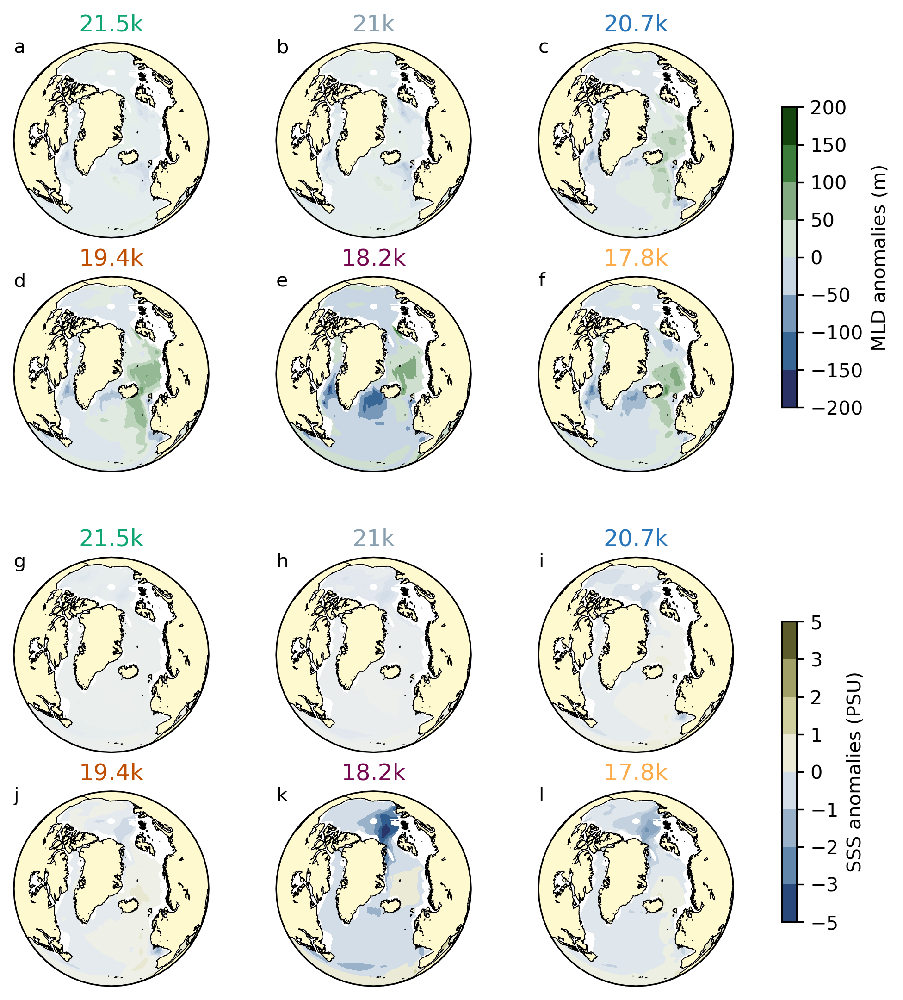

In [33]:
projection_map = ccrs.NearsidePerspective(central_longitude=-30, central_latitude=70, satellite_height=3000000)
figure = plt.figure(figsize=(9,9), dpi=300)

grid = figure.add_gridspec(2, 1, hspace=0.2)

gridMLD = grid[0].subgridspec(2, 3, wspace=0.05)
axMLD = {}
((axMLD['xoupd'], axMLD['xouph'], axMLD['tfgbi']), 
 (axMLD['xoupl'], axMLD['xoupf'], axMLD['tfgbj'])) = gridMLD.subplots(subplot_kw={'projection':projection_map})

gridSSS = grid[1].subgridspec(2, 3, wspace=0.05)
axSSS = {}
((axSSS['xoupd'], axSSS['xouph'], axSSS['tfgbi']), 
 (axSSS['xoupl'], axSSS['xoupf'], axSSS['tfgbj'])) = gridSSS.subplots(subplot_kw={'projection':projection_map})

norm_mld = plots.TwoSlopeNorm(vcenter=0., symetrical=True, 
                              in_values=[mld_mode['warm'][expt] - mld_ref for expt in ['tfgbi', 'xoupl', 'tfgbj', 'xoupd', 'xouph', 'xoupf']])
norm_sss = plots.TwoSlopeNorm(vcenter=0., symetrical=True, 
                              in_values=[sss_mode['warm'][expt] - sss_ref for expt in ['tfgbi', 'xoupl', 'tfgbj', 'xoupd', 'xouph', 'xoupf']])


for expt in ['tfgbi', 'xoupl', 'tfgbj', 'xoupd', 'xouph', 'xoupf']:
    axMLD[expt].contourf(lon_ocn, lat_ocn, mld_mode['warm'][expt] - mld_ref, cmap=scm.cork, norm=norm_mld, transform=ccrs.PlateCarree())
    axMLD[expt].add_feature(lgm_feature, zorder=1)
    axMLD[expt].set_global()
    axMLD[expt].set_title(labels[expt], color=colors[expt])
    
    axSSS[expt].contourf(lon_ocn, lat_ocn, sss_mode['warm'][expt] - sss_ref, cmap=scm.broc, norm=norm_sss, transform=ccrs.PlateCarree())
    axSSS[expt].add_feature(lgm_feature, zorder=1)
    axSSS[expt].set_global()
    axSSS[expt].set_title(labels[expt], color=colors[expt])

    
figure.colorbar(mappable=norm_mld.generate_mappable(cmap=scm.cork), ax=list(axMLD.values()),
                boundaries=[-200,-150,-100,-50,0,50,100,150,200],
                shrink=0.7, label="MLD anomalies (m)")

figure.colorbar(mappable=norm_sss.generate_mappable(cmap=scm.broc), ax=list(axSSS.values()),
                boundaries=[-5,-3,-2,-1,0,1,2,3,5],
                shrink=0.7, label="SSS anomalies (PSU)")

axMLD['xoupd'].annotate('a', xy=(0, 0.95), xycoords='axes fraction', size=10)
axMLD['xouph'].annotate('b', xy=(0, 0.95), xycoords='axes fraction', size=10)
axMLD['tfgbi'].annotate('c', xy=(0, 0.95), xycoords='axes fraction', size=10)
axMLD['xoupl'].annotate('d', xy=(0, 0.95), xycoords='axes fraction', size=10)
axMLD['xoupf'].annotate('e', xy=(0, 0.95), xycoords='axes fraction', size=10)
axMLD['tfgbj'].annotate('f', xy=(0, 0.95), xycoords='axes fraction', size=10)

axSSS['xoupd'].annotate('g', xy=(0, 0.95), xycoords='axes fraction', size=10)
axSSS['xouph'].annotate('h', xy=(0, 0.95), xycoords='axes fraction', size=10)
axSSS['tfgbi'].annotate('i', xy=(0, 0.95), xycoords='axes fraction', size=10)
axSSS['xoupl'].annotate('j', xy=(0, 0.95), xycoords='axes fraction', size=10)
axSSS['xoupf'].annotate('k', xy=(0, 0.95), xycoords='axes fraction', size=10)
axSSS['tfgbj'].annotate('l', xy=(0, 0.95), xycoords='axes fraction', size=10)

In [ ]:
# figure.savefig('Figures/mld_sss.pdf', bbox_inches='tight', format='pdf')

### Figure S6 - Zone definitons

In [34]:
zone = {}
zone['gin'] = zones.Box(345, 375, 63, 73, z_min = -1000).create_cycle()
zone['ls'] = zones.Box(295, 315, 50, 65, z_min = -1000)
zone['irm'] = zones.Box(320, 338, 55, 67, z_min = -1000).create_cycle()
zone['esa'] = zones.Box(320, 375, 55, 73, z_min = -1000).create_cycle()

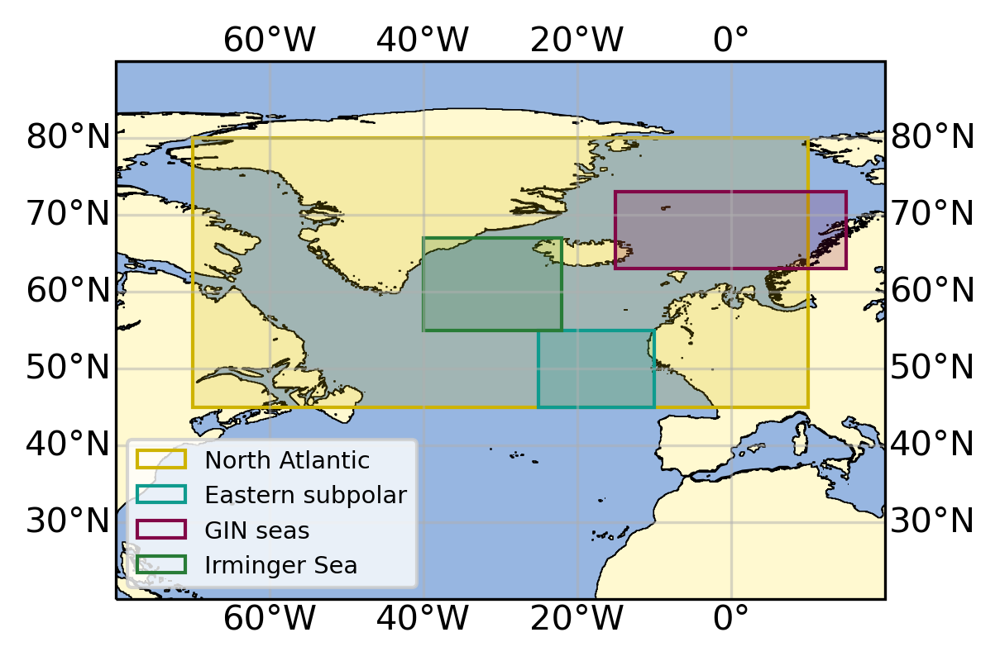

In [35]:
projection_map = ccrs.PlateCarree()

figMap, axMap = plt.subplots(nrows=1, ncols=1, subplot_kw={'projection':projection_map}, figsize=(4,3), dpi=300)

axMap.fill(zone_na[0], zone_na[1], color='xkcd:mustard', linestyle = "-", alpha = 1, transform=ccrs.PlateCarree(), fill=False, label="North Atlantic")
axMap.fill(zone_na[0], zone_na[1], color='xkcd:mustard', linestyle = "-", alpha = 0.2, transform=ccrs.PlateCarree(), fill=True)
axMap.fill(zone_esp[0], zone_esp[1], color='xkcd:blue/green', linestyle = "-", alpha = 1, transform=ccrs.PlateCarree(), fill=False, label="Eastern subpolar")
axMap.fill(zone_esp[0], zone_esp[1], color='xkcd:blue/green', linestyle = "-", alpha = 0.2, transform=ccrs.PlateCarree(), fill=True)
axMap.fill(zone['gin'][0], zone['gin'][1], color='xkcd:red purple', linestyle = "-", alpha = 1, transform=ccrs.PlateCarree(), fill=False, label="GIN seas")
axMap.fill(zone['gin'][0], zone['gin'][1], color='xkcd:red purple', linestyle = "-", alpha = 0.2, transform=ccrs.PlateCarree(), fill=True)
axMap.fill(zone['irm'][0], zone['irm'][1], color='xkcd:darkish green', linestyle = "-", alpha = 1, transform=ccrs.PlateCarree(), fill=False, label="Irminger Sea")
axMap.fill(zone['irm'][0], zone['irm'][1], color='xkcd:darkish green', linestyle = "-", alpha = 0.2, transform=ccrs.PlateCarree(), fill=True)

axMap.add_feature(lgm_feature, zorder=0)
axMap.add_feature(cartopy.feature.OCEAN, zorder=-1, edgecolor='black')
gl = axMap.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, alpha=0.5, linestyle='-')
axMap.set_extent([280,380,20,90])
axMap.legend(fontsize="x-small")

In [36]:
# figMap.savefig('Figures/zones.pdf', bbox_inches='tight', format='pdf')

### Figure S7 - Effect of the algorithm on the Southern Ocean circulation

In [37]:
ds_wfix = xr.open_dataset(f"{data_folder}/lgm_inputs/qrparm.waterfix.hadcm3.nc")
wfix = ds_wfix.field672.isel(t=0).isel(depth=0)
lon = ds_wfix.longitude.values
lat = ds_wfix.latitude.values

mw_215 = xr.open_dataset(f"{data_folder}/mw_inputs/xoup.wfix.lgm.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix
mw_21 = xr.open_dataset(f"{data_folder}/mw_inputs/xoup.wfix.lgm1.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix
# mw_207 = xr.open_dataset("/nfs/see-fs-01_users/eeymr/my_ancil/HadCM3/xoup/xoup.wfix.lgm2.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix
# mw_194 = xr.open_dataset("/nfs/see-fs-01_users/eeymr/my_ancil/HadCM3/xoup/xoup.wfix.lgm_na.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix
# mw_182 = xr.open_dataset("/nfs/see-fs-01_users/eeymr/my_ancil/HadCM3/xoup/xoup.wfix.lgm_arc.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix
# mw_178 = xr.open_dataset("/nfs/see-fs-01_users/eeymr/my_ancil/HadCM3/xoup/xoup.wfix.lgm_arc2.nc", decode_times=False).field672.isel(t=0).isel(depth=0) - wfix

In [38]:
stream, vstream = {}, {}

stream['xoupa'] = hcm3.OCNSTREAMATS('xoupa', start_year=3800, end_year=3900, chunks=10).stream(mode_t='mean')
vstream['xoupa'] = stream['xoupa'].values()
stream['xouph'] = hcm3.OCNSTREAMATS('xouph', start_year=4800, end_year=4900, chunks=10).stream(mode_t='mean')
vstream['xouph'] = stream['xouph'].values()
stream['xoupd'] = hcm3.OCNSTREAMATS('xoupd', start_year=4800, end_year=4900, chunks=10).stream(mode_t='mean')
vstream['xoupd'] = stream['xoupd'].values()

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.OCNSTREAMATS'> : xoupa between years 3800 and 3900.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing ocean barotropic streamfunction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.OCNSTREAMATS'> : xouph between years 4800 and 4900.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing ocean barotropic streamfunction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.OCNSTREAMATS'> : xoupd between years 4800 and 4900.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing ocean barotropic streamfunction.
____ Coordinates imported in the GeoDataArray instance.
____ Processing t: mean

__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence


/nfs/see-fs-01_users/eeymr/.conda/envs/eeymr/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: Log scale: values of z <= 0 have been masked
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


Text(0, 0.95, 'c')

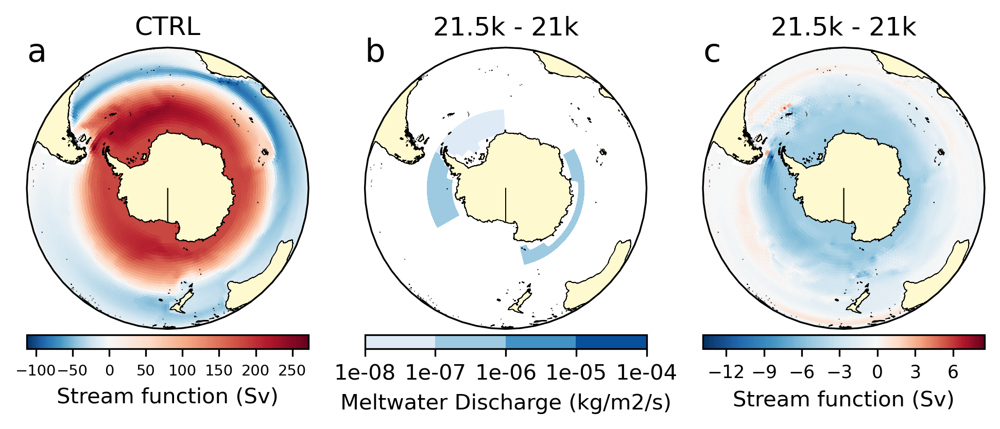

In [39]:
projection_map = ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90.0, satellite_height=35785831)
# projection_map = ccrs.PlateCarree()

figure, (axCTRL, axXOUPHDMW, axXOUPHD) = plt.subplots(nrows=1, ncols=3, figsize=(8,5), dpi=300, 
                                                        subplot_kw={'projection':projection_map})

bounds = np.arange(-100, 300, 50)
norm = plots.TwoSlopeNorm(vcenter=0, in_values=[vstream['xoupa']])
cm = axCTRL.pcolormesh(stream['xoupa'].lon_p, stream['xoupa'].lat_p, vstream['xoupa'], 
                       cmap="RdBu_r", norm=norm, transform=ccrs.PlateCarree())
axCTRL.add_feature(lgm_feature, zorder=1)
axCTRL.set_title(f"{labels['xoupa']}")
axCTRL.set_global()
cbar = figure.colorbar(mappable=cm, ax=[axCTRL], label="Stream function (Sv)", ticks=bounds, orientation='horizontal', pad=0.01)
cbar.ax.tick_params(labelsize='x-small')

bounds = np.array([10**(-8), 10**(-7), 10**(-6), 10**(-5), 10**(-4)])
norm = mpl.colors.Normalize(vmin=0, vmax=10**(-4))
cm = axXOUPHDMW.contourf(lon, lat, mw_21 - mw_215, cmap="Blues", levels=bounds, norm=mpl.colors.LogNorm(), transform=ccrs.PlateCarree())
axXOUPHDMW.set_global()
axXOUPHDMW.set_title(f"{labels['xoupd']} - {labels['xouph']}")
axXOUPHDMW.add_feature(lgm_feature, zorder=1)
figure.colorbar(mappable=cm, ax=axXOUPHDMW, ticks=bounds, orientation='horizontal', pad=0.01, format='%.0e', label="Meltwater Discharge (kg/m2/s)")
         
bounds = np.array([-12, -9, -6, -3, 0, 3, 6])
norm = plots.TwoSlopeNorm(vcenter=0, in_values=[vstream['xoupd'] - vstream['xoupa']])
cm = axXOUPHD.pcolormesh(stream['xoupa'].lon_p, stream['xoupa'].lat_p, vstream['xoupd'] - vstream['xoupa'], 
                        cmap="RdBu_r", norm=norm, transform=ccrs.PlateCarree())
axXOUPHD.add_feature(lgm_feature, zorder=1)
axXOUPHD.set_title(f"{labels['xoupd']} - {labels['xouph']}")
axXOUPHD.set_global()
cbar = figure.colorbar(mappable=cm, ax=[axXOUPHD], label="Stream function (Sv)", ticks=bounds, orientation='horizontal', pad=0.01)
cbar.ax.tick_params(labelsize='small')

axCTRL.annotate('a', xy=(0, 0.95), xycoords='axes fraction', size=15)
axXOUPHDMW.annotate('b', xy=(0, 0.95), xycoords='axes fraction', size=15)
axXOUPHD.annotate('c', xy=(0, 0.95), xycoords='axes fraction', size=15)

In [40]:
# figure.savefig('Figures/gst_so.pdf', bbox_inches='tight', format='pdf')

### Figure S8 - Crash

In [41]:
ds = xr.open_dataset(f"{data_folder}/crash_data/xohzno#pf000003879dc+_stream.nc")

pre_crash_stream = ds.field611.isel(t=0).isel(unspecified=0, drop=True)
crash_stream = ds.field611.isel(t=-30).isel(unspecified=0, drop=True)
post_crash_stream = ds.field611.isel(t=-23).isel(unspecified=0, drop=True)

__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence


Text(0, 1.02, 'c')

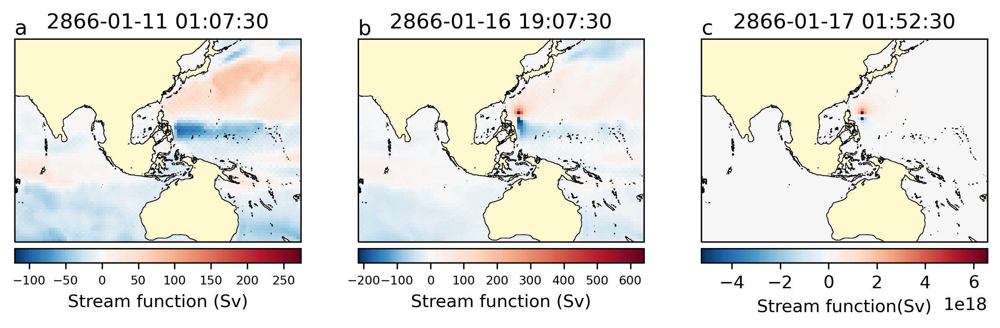

In [42]:
figMap, (axPreCrash, axCrash, axPostCrash) = plt.subplots(nrows=1, ncols=3, figsize=(10,7), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})

norm = plots.TwoSlopeNorm(vcenter=0, in_values=[pre_crash_stream.values*10**(-12)])
cm = axPreCrash.pcolormesh(pre_crash_stream.longitude_1, pre_crash_stream.latitude_1, pre_crash_stream.values*10**(-12), cmap="RdBu_r", norm=norm, transform=ccrs.PlateCarree())
axPreCrash.add_feature(lgm_feature, zorder=1)
axPreCrash.set_extent([60,180,-20,30])
axPreCrash.set_title(pre_crash_stream.t.values - datetime.timedelta(days=1000*365))
cbar = figMap.colorbar(mappable=cm, ax=[axPreCrash], label="Stream function (Sv)", orientation='horizontal', pad=0.01)
cbar.ax.tick_params(labelsize='x-small')

norm = plots.TwoSlopeNorm(vcenter=0, in_values=[crash_stream.values*10**(-12)])
cm = axCrash.pcolormesh(crash_stream.longitude_1, crash_stream.latitude_1, crash_stream.values*10**(-12), cmap="RdBu_r", norm=norm, transform=ccrs.PlateCarree())
axCrash.add_feature(lgm_feature, zorder=1)
axCrash.set_extent([60,180,-20,30])
axCrash.set_title(crash_stream.t.values - datetime.timedelta(days=1000*365))
cbar = figMap.colorbar(mappable=cm, ax=[axCrash], label="Stream function (Sv)", orientation='horizontal', pad=0.01)
cbar.ax.tick_params(labelsize='x-small')

norm = plots.TwoSlopeNorm(vcenter=0, in_values=[post_crash_stream.values*10**(-12)])
cm = axPostCrash.pcolormesh(post_crash_stream.longitude_1, post_crash_stream.latitude_1, post_crash_stream.values*10**(-12), cmap="RdBu_r", norm=norm, transform=ccrs.PlateCarree())
axPostCrash.add_feature(lgm_feature, zorder=1)
axPostCrash.set_extent([60,180,-20,30])
axPostCrash.set_title(post_crash_stream.t.values - datetime.timedelta(days=1000*365))
cbar = figMap.colorbar(mappable=cm, ax=[axPostCrash], label="Stream function(Sv)", orientation='horizontal', pad=0.01)
cbar.ax.tick_params(labelsize='medium')

axPreCrash.annotate('a', xy=(0, 1.02), xycoords='axes fraction', size=12)
axCrash.annotate('b', xy=(0, 1.02), xycoords='axes fraction', size=12)
axPostCrash.annotate('c', xy=(0, 1.02), xycoords='axes fraction', size=12)

In [43]:
# figMap.savefig('Figures/crash.pdf', bbox_inches='tight', format='pdf')

### Figure S9 - Effect of the smoothing algorithm

In [44]:
spans = {'start_smooth':4900, 'end_smooth':4999, 'start_raw':3000, 'end_raw':3100}

In [45]:
bath_raw, bath_smooth = {}, {}
stream_raw, stream_smooth = {}, {}
precip_raw, precip_smooth = {}, {}
sst_raw, sst_smooth = {}, {}
sss_raw, sss_smooth = {}, {}
sat_raw, sat_smooth = {}, {}
p_value = 0.1

sat_raw['xoupa'] = hcm3.SATATS('xoupa', start_year=spans['start_raw'], end_year=spans['end_raw']-1, chunks=10).sat()
sat_smooth['xoupa'] = hcm3.SATATS('xoupa', start_year=spans['start_smooth'], end_year=spans['end_smooth'], chunks=10).sat()
sat_ttest = util.ttest(sat_raw['xoupa'].values(), sat_smooth['xoupa'].values(), p_value)
sat_anmly = np.mean(sat_smooth['xoupa'].values(), axis=0) - np.mean(sat_raw['xoupa'].values(), axis=0)

sst_raw['xoupa'] = hcm3.SSTATS('xoupa', start_year=spans['start_raw'], end_year=spans['end_raw']-1, chunks=10).sst()
sst_smooth['xoupa'] = hcm3.SSTATS('xoupa', start_year=spans['start_smooth'], end_year=spans['end_smooth'], chunks=10).sst()
sst_ttest = util.ttest(sst_raw['xoupa'].values(), sst_smooth['xoupa'].values(), p_value)
sst_anmly = np.mean(sst_smooth['xoupa'].values(), axis=0) - np.mean(sst_raw['xoupa'].values(), axis=0)

sss_raw['xoupa'] = hcm3.SAL01ATS('xoupa', start_year=spans['start_raw'], end_year=spans['end_raw']-1, chunks=10).salinity()
sss_smooth['xoupa'] = hcm3.SAL01ATS('xoupa', start_year=spans['start_smooth'], end_year=spans['end_smooth'], chunks=10).salinity()
sss_ttest = util.ttest(sss_raw['xoupa'].values(), sss_smooth['xoupa'].values(), p_value)
sss_anmly = np.mean(sss_smooth['xoupa'].values(), axis=0) - np.mean(sss_raw['xoupa'].values(), axis=0)

stream_raw['xoupa'] = hcm3.OCNSTREAMATS('xoupa', start_year=spans['start_raw'], end_year=spans['end_raw']-1, chunks=10).stream()
stream_smooth['xoupa'] = hcm3.OCNSTREAMATS('xoupa', start_year=spans['start_smooth'], end_year=spans['end_smooth'], chunks=10).stream()
stream_ttest = util.ttest(stream_raw['xoupa'].values(), stream_smooth['xoupa'].values(), p_value)
stream_anmly = np.mean(stream_smooth['xoupa'].values(), axis=0) - np.mean(stream_raw['xoupa'].values(), axis=0)

precip_raw['xoupa'] = hcm3.PRECIPATS('xoupa', start_year=spans['start_raw'], end_year=spans['end_raw']-1, chunks=10).precip()
precip_smooth['xoupa'] = hcm3.PRECIPATS('xoupa', start_year=spans['start_smooth'], end_year=spans['end_smooth'], chunks=10).precip()
precip_ttest = util.ttest(precip_raw['xoupa'].values(), precip_smooth['xoupa'].values(), p_value)
precip_anmly = np.mean(precip_smooth['xoupa'].values(), axis=0) - np.mean(precip_raw['xoupa'].values(), axis=0)

bath_raw['xoupa'] = util.extract_bathymetry(xr.open_dataset("/nfs/see-fs-01_users/eeymr/dump2hold/xoupa/pg/xoupao#pg000003000c1+.nc"))
bath_smooth['xoupa'] = util.extract_bathymetry(xr.open_dataset("/nfs/see-fs-01_users/eeymr/dump2hold/xoupa/pg/xoupao#pg000004900c1+.nc"))

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupa between years 3000 and 3099.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : xoupa between years 3000 and 3099.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SST.
____ Coordinates imported in the GeoDataArray instance.
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : xoupa between years 4900 and 4999.
____ Import succeeded.
____ Coordin

__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence
__ Initialsing the norm from the array sequence


Text(0, 1.05, 'f')

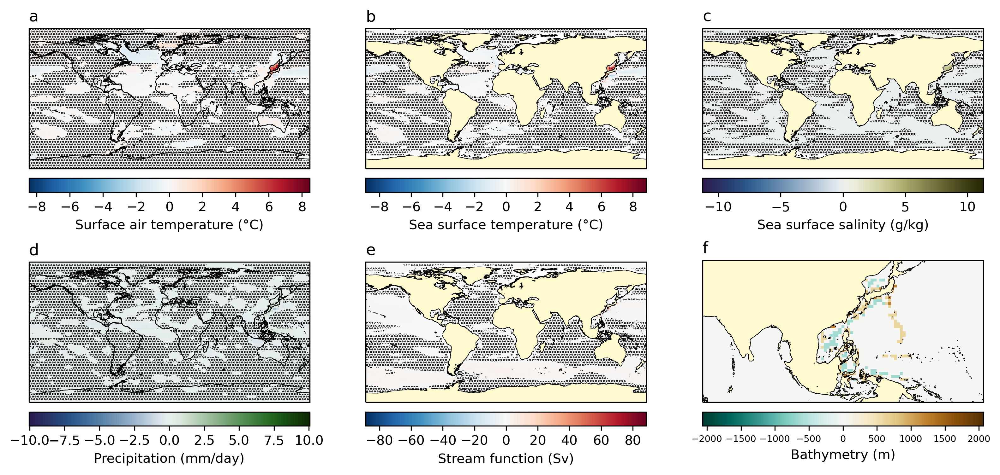

In [46]:
figMap, ((axSAT, axSST, axSSS), (axPrecip, axStream, axBath)) = plt.subplots(nrows=2, ncols=3, figsize=(13,6), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})

norm_sat = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[sat_anmly])
cm_sat = axSAT.pcolormesh(sat_smooth['xoupa'].lon_p, sat_smooth['xoupa'].lat_p, sat_anmly, cmap="RdBu_r", norm=norm_sat, transform=ccrs.PlateCarree())
axSAT.contourf(sat_smooth['xoupa'].lon_p, sat_smooth['xoupa'].lat_p, 
               np.where(sat_ttest==False, sat_ttest, np.nan),
               hatches=["......"], cmap='gray', alpha=0)
axSAT.add_feature(lgm_coastline, zorder=1)
axSAT.set_global()
figMap.colorbar(mappable=cm_sat, ax=axSAT, label="Surface air temperature (°C)", orientation='horizontal', pad=0.05)

norm_sst = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[sst_anmly])
cm_sst = axSST.pcolormesh(sst_smooth['xoupa'].lon_p, sst_smooth['xoupa'].lat_p, sst_anmly, norm=norm_sst, cmap="RdBu_r", transform=ccrs.PlateCarree())
axSST.contourf(sst_smooth['xoupa'].lon_p, sst_smooth['xoupa'].lat_p, 
               np.where(sst_ttest==False, sst_ttest, np.nan),
               hatches=["......"], cmap='gray', alpha=0)
axSST.add_feature(lgm_feature, zorder=1)
axSST.set_global()
figMap.colorbar(mappable=cm_sst, ax=axSST, label="Sea surface temperature (°C)", orientation='horizontal', pad=0.05)

norm_sss = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[sss_smooth['xoupa'].values() - sss_raw['xoupa'].values()])
cm_sss = axSSS.pcolormesh(sss_smooth['xoupa'].lon_p, sss_smooth['xoupa'].lat_p, sss_anmly, cmap=scm.broc, norm=norm_sss, transform=ccrs.PlateCarree())
axSSS.contourf(sss_smooth['xoupa'].lon_p, sss_smooth['xoupa'].lat_p, 
               np.where(sss_ttest==False, sss_ttest, np.nan),
               hatches=["......"], cmap='gray', alpha=0)
axSSS.add_feature(lgm_feature, zorder=1)
axSSS.set_global()
figMap.colorbar(mappable=cm_sss, ax=axSSS, label="Sea surface salinity (g/kg)", orientation='horizontal', pad=0.05)

norm_precip = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[precip_smooth['xoupa'].values() - precip_raw['xoupa'].values()])
cm_precip = axPrecip.pcolormesh(precip_smooth['xoupa'].lon_p, precip_smooth['xoupa'].lat_p, precip_anmly, cmap=scm.cork, norm=norm_precip, transform=ccrs.PlateCarree())
axPrecip.contourf(precip_smooth['xoupa'].lon_p, precip_smooth['xoupa'].lat_p, 
               np.where(precip_ttest==False, precip_ttest, np.nan),
               hatches=["......"], cmap='gray', alpha=0)
axPrecip.add_feature(lgm_coastline, zorder=1)
axPrecip.set_global()
figMap.colorbar(mappable=cm_precip, ax=axPrecip, label="Precipitation (mm/day)", orientation='horizontal', pad=0.05)

norm_stream = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[stream_smooth['xoupa'].values() - stream_raw['xoupa'].values()])
cm_stream = axStream.pcolormesh(stream_smooth['xoupa'].lon_p, stream_smooth['xoupa'].lat_p, stream_anmly, cmap="RdBu_r", norm=norm_stream, transform=ccrs.PlateCarree())
axStream.contourf(stream_smooth['xoupa'].lon_p, stream_smooth['xoupa'].lat_p, 
               np.where(stream_ttest==False, stream_ttest, np.nan),
               hatches=["......"], cmap='gray', alpha=0)
axStream.add_feature(lgm_feature, zorder=1)
axStream.set_global()
figMap.colorbar(mappable=cm_stream, ax=axStream, label="Stream function (Sv)", orientation='horizontal', pad=0.05)

norm_bath = plots.TwoSlopeNorm(vcenter=0., symetrical=True, in_values=[bath_smooth['xoupa'] - bath_raw['xoupa']])
cm_bath = axBath.pcolormesh(sst_smooth['xoupa'].lon, sst_smooth['xoupa'].lat, bath_smooth['xoupa'] - bath_raw['xoupa'], cmap="BrBG_r", norm=norm_bath, transform=ccrs.PlateCarree())
axBath.add_feature(lgm_feature, zorder=1)
axBath.set_extent([60,180,-6,30])
cbar = figMap.colorbar(mappable=cm_bath, ax=axBath, label="Bathymetry (m)", orientation='horizontal', pad=0.05)
cbar.ax.tick_params(labelsize='x-small')


axSAT.annotate('a', xy=(0, 1.05), xycoords='axes fraction', size=12)
axSST.annotate('b', xy=(0, 1.05), xycoords='axes fraction', size=12)
axSSS.annotate('c', xy=(0, 1.05), xycoords='axes fraction', size=12)
axPrecip.annotate('d', xy=(0, 1.05), xycoords='axes fraction', size=12)
axStream.annotate('e', xy=(0, 1.05), xycoords='axes fraction', size=12)
axBath.annotate('f', xy=(0, 1.05), xycoords='axes fraction', size=12)

In [47]:
# figMap.savefig('Figures/smoothing.pdf', bbox_inches='tight', format='pdf')

### Figure S10 and S11 - Picking AMOC and NGRIP modes

In [48]:
## Functions for method 5

def identify_min(signal):
    dsignal, lim = np.diff(signal), np.min(signal) + 1*(np.max(signal) - np.min(signal))/3
    index_min=[]

    i = 0
    while i<len(signal)-2:
        if np.sign(dsignal[i])!=np.sign(dsignal[i+1]) and dsignal[i]<0 and signal[i]<lim:
            index_min.append(i)
            i+=500
        else:
            i+=1
    return index_min
            
def identify_max(signal):
    dsignal, lim = np.diff(signal), np.min(signal) + 2*(np.max(signal) - np.min(signal))/3
    index_min=[]

    i = 0
    while i<len(signal)-2:
        if np.sign(dsignal[i])!=np.sign(dsignal[i+1]) and dsignal[i]>0 and signal[i]>lim:
            index_min.append(i)
            i+=500
        else:
            i+=1
    return index_min

def span_from_index(signal, indexes, span_size=50):
    array = np.empty(len(signal))
    array[:] = np.NaN
    for index in indexes:
        if index+span_size//2<len(signal) and index-span_size//2>=0:
            array[index-span_size//2:index+span_size//2] = signal[index-span_size//2:index+span_size//2]
    return array

In [49]:
ngrip, amoc = {}, {}
amocv, ngripv, n, time = {}, {}, {}, {}

for expt in ['tfgbi', 'tfgbj', 'xoupf', 'xouph']:
    ngrip[expt] = hcm3.SATATS(expt, chunks=10).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)
    amoc[expt] = hcm3.MERIDATS(expt, chunks=10).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")

ngrip['xoupl'] = hcm3.SATATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.SATATS('xoupl', chunks=10)).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)
amoc['xoupl'] = hcm3.MERIDATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.MERIDATS('xoupl', chunks=10)).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")

amoc['xoupd'] = hcm3.MERIDATS('tfgbd', end_year=4060, chunks=10).concat(hcm3.MERIDATS('xoupd', chunks=10)).atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
ngrip['xoupd'] = hcm3.SATATS('tfgbd', end_year=4060, chunks=10).concat(hcm3.SATATS('xoupd', chunks=10)).sat(mode_lat="value", value_lat=75, mode_lon="value", value_lon = 318)

for expt in ['xoupd', 'tfgbi', 'tfgbj', 'xoupl', 'xoupf', 'xouph']:
    n[expt] = min(len(amoc[expt].t), len(ngrip[expt].t))
    amocv[expt] = util.rmean(amoc[expt].values(), 30)[:n[expt]]
    ngripv[expt] = util.rmean(ngrip[expt].values(), 30)[:n[expt]]
    time[expt] = amoc[expt].processed_time(start_dates[expt])[:n[expt]]

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbi between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ New longitude value : 318.75
____ New latitude value : 75.0
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbi between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ New latitude value : 26.25
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
__

In [50]:
psd, fq, harm, fc, = {}, {}, {}, {}
ngripf, amocf = {}, {}

filt = util.ButterLowPass(order=1, fc=2*10**-3, fs=1, mult=2)

for expt in ['tfgbi', 'xoupl', 'xoupf', 'tfgbj', 'xoupd', 'xouph']:
    psd[expt], fq[expt] = util.psd(ngrip[expt].values(), fs=1, scale_by_freq=True)
    harm[expt] = np.where(fq[expt]<=10**-1)
    fc[expt] = util.fundamental_fq(psd[expt], fq[expt])
    
    ngripf[expt] = filt.process(ngrip[expt].values())[:n[expt]]  
    amocf[expt] = filt.process(amoc[expt].values())[:n[expt]]  

In [51]:
amocc, amocw = {}, {}
ngripc, ngripw, = {}, {}
clim, wlim = {}, {}
imin_amoc, imax_amoc = {}, {}

for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
    clim[method], wlim[method] = {}, {}

for expt in ['xoupd', 'tfgbi', 'tfgbj', 'xoupl', 'xoupf', 'xouph']:
    
    clim['Method 1'][expt] = np.min(amocv[expt]) + 1*(np.max(amocv[expt]) - np.min(amocv[expt]))/3
    wlim['Method 1'][expt] = np.min(amocv[expt]) + 2*(np.max(amocv[expt]) - np.min(amocv[expt]))/3

    clim['Method 1b'][expt] = np.min(amocf[expt]) + 1*(np.max(amocf[expt]) - np.min(amocf[expt]))/3
    wlim['Method 1b'][expt] = np.min(amocf[expt]) + 2*(np.max(amocf[expt]) - np.min(amocf[expt]))/3

    clim['Method 2'][expt] = np.min(ngripv[expt]) + 1*(np.max(ngripv[expt]) - np.min(ngripv[expt]))/3
    wlim['Method 2'][expt] = np.min(ngripv[expt]) + 2*(np.max(ngripv[expt]) - np.min(ngripv[expt]))/3

    if expt not in ['xoupd', 'xouph']:
        clim['Method 3'][expt] = np.min(amocv[expt][1000:]) + 1*(np.max(amocv[expt][1000:]) - np.min(amocv[expt][1000:]))/4
        wlim['Method 3'][expt] = np.min(amocv[expt][1000:]) + 3*(np.max(amocv[expt][1000:]) - np.min(amocv[expt][1000:]))/4
    else:
        clim['Method 3'][expt] = np.min(amocv[expt]) + 1*(np.max(amocv[expt]) - np.min(amocv[expt]))/4
        wlim['Method 3'][expt] = np.min(amocv[expt]) + 3*(np.max(amocv[expt]) - np.min(amocv[expt]))/4

    clim['Method 4'] = {'xoupd':14, 'xouph':12, 'tfgbi':8, 'tfgbj':8, 'xoupl':8, 'xoupf':8}
    wlim['Method 4'] = {'xoupd':14.5, 'xouph':14.5, 'tfgbi':15, 'tfgbj':15, 'xoupl':16, 'xoupf':13.5}

    imin_amoc[expt] = identify_min(amocf[expt])
    imax_amoc[expt] = identify_max(amocf[expt])


for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
    amocc[method], amocw[method] = {}, {}
    ngripc[method], ngripw[method] = {}, {}
    
    for expt in ['xoupd', 'tfgbi', 'tfgbj', 'xoupl', 'xoupf', 'xouph']:

        print(f"Processing {method} - {expt}")

        if method in ['Method 1', 'Method 3', 'Method 4']:
            amocc[method][expt] = np.where(amocv[expt]<=clim[method][expt], amocv[expt], np.nan)
            amocw[method][expt] = np.where(amocv[expt]>=wlim[method][expt], amocv[expt], np.nan)
            ngripc[method][expt] = np.where(amocv[expt]<=clim[method][expt], ngripv[expt], np.nan)
            ngripw[method][expt] = np.where(amocv[expt]>=wlim[method][expt], ngripv[expt], np.nan)
        
        elif method=='Method 1b':
            amocc[method][expt] = np.where(amocf[expt]<=clim[method][expt], amocf[expt], np.nan)
            amocw[method][expt] = np.where(amocf[expt]>=wlim[method][expt], amocf[expt], np.nan)
            ngripc[method][expt] = np.where(amocf[expt]<=clim[method][expt], ngripf[expt], np.nan)
            ngripw[method][expt] = np.where(amocf[expt]>=wlim[method][expt], ngripf[expt], np.nan)

        elif method=='Method 2':
            ngripc[method][expt] = np.where(ngripv[expt]<=clim[method][expt], ngripv[expt], np.nan)
            ngripw[method][expt] = np.where(ngripv[expt]>=wlim[method][expt], ngripv[expt], np.nan)
            amocc[method][expt] = np.where(ngripv[expt]<=clim[method][expt], amocv[expt], np.nan)
            amocw[method][expt] = np.where(ngripv[expt]>=wlim[method][expt], amocv[expt], np.nan)
   
        elif method=='Method 5':
            amocc[method][expt] = span_from_index(amocf[expt], imin_amoc[expt], span_size=150)
            ngripc[method][expt] = span_from_index(ngripf[expt], imin_amoc[expt], span_size=150)
            amocw[method][expt] = span_from_index(amocf[expt], imax_amoc[expt], span_size=150)
            ngripw[method][expt] = span_from_index(ngripf[expt], imax_amoc[expt], span_size=150)

Processing Method 1 - xoupd
Processing Method 1 - tfgbi
Processing Method 1 - tfgbj
Processing Method 1 - xoupl
Processing Method 1 - xoupf
Processing Method 1 - xouph
Processing Method 1b - xoupd
Processing Method 1b - tfgbi
Processing Method 1b - tfgbj
Processing Method 1b - xoupl
Processing Method 1b - xoupf
Processing Method 1b - xouph
Processing Method 2 - xoupd
Processing Method 2 - tfgbi
Processing Method 2 - tfgbj
Processing Method 2 - xoupl
Processing Method 2 - xoupf
Processing Method 2 - xouph
Processing Method 3 - xoupd
Processing Method 3 - tfgbi
Processing Method 3 - tfgbj
Processing Method 3 - xoupl
Processing Method 3 - xoupf
Processing Method 3 - xouph
Processing Method 4 - xoupd
Processing Method 4 - tfgbi
Processing Method 4 - tfgbj
Processing Method 4 - xoupl
Processing Method 4 - xoupf
Processing Method 4 - xouph
Processing Method 5 - xoupd
Processing Method 5 - tfgbi
Processing Method 5 - tfgbj
Processing Method 5 - xoupl
Processing Method 5 - xoupf
Processing Met

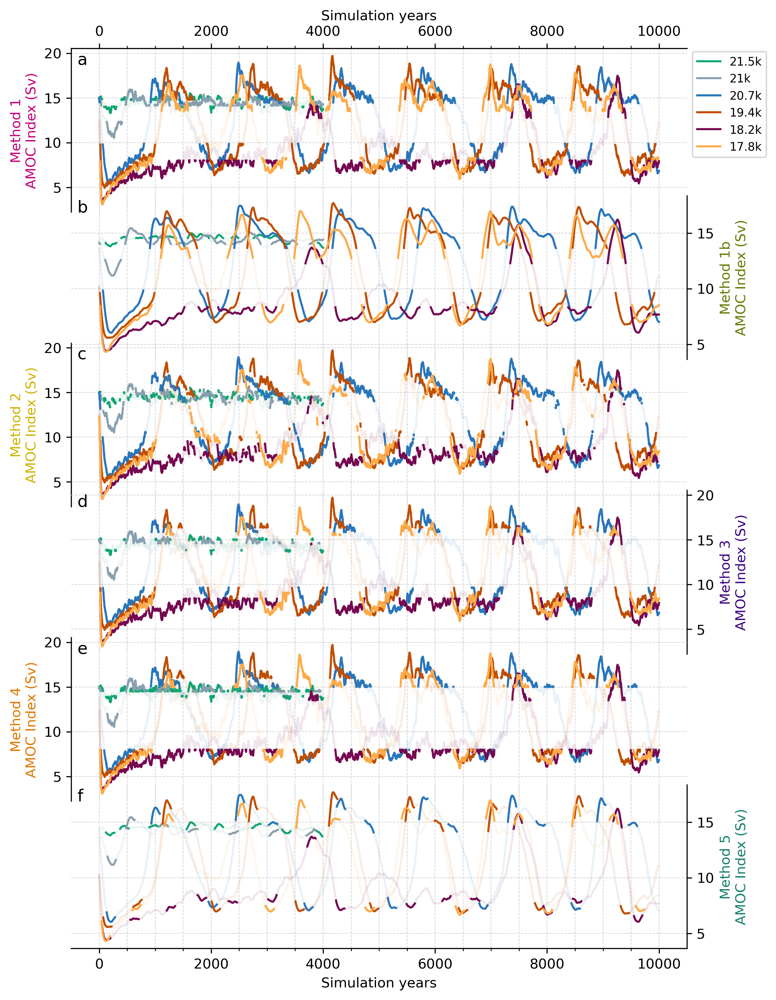

In [52]:
figMap = plt.figure(figsize=(8, 12), dpi=300, facecolor='None')

axAMOC = {}

gs = figMap.add_gridspec(nrows=6, ncols=1, hspace=-0.1)
(axAMOC['Method 1'], axAMOC['Method 1b'], axAMOC['Method 2'], axAMOC['Method 3'], axAMOC['Method 4'], axAMOC['Method 5']) = gs.subplots(
    subplot_kw={'facecolor':'None'})

letter = 'a'

for expt in ['xoupd', 'xouph', 'tfgbi', 'xoupl', 'xoupf', 'tfgbj']:
    for method in ['Method 1', 'Method 2', 'Method 3', 'Method 4']:
        axAMOC[method].plot(time[expt], amocv[expt], color=colors[expt], linestyle="-", alpha=0.1)
        axAMOC[method].plot(time[expt], amocc[method][expt], color=colors[expt], linestyle="-")
        axAMOC[method].plot(time[expt], amocw[method][expt], color=colors[expt], linestyle="-", 
                            label=labels[expt])
    for method in ['Method 1b', 'Method 5']:
        axAMOC[method].plot(time[expt], amocf[expt], color=colors[expt], linestyle="-", alpha=0.1)
        axAMOC[method].plot(time[expt], amocc[method][expt], color=colors[expt], linestyle="-")
        axAMOC[method].plot(time[expt], amocw[method][expt], color=colors[expt], linestyle="-", 
                            label=labels[expt])
    
for method in ['Method 1', 'Method 2', 'Method 4']:
    axAMOC[method].spines['right'].set_visible(False)
    axAMOC[method].spines['top'].set_visible(False)
    axAMOC[method].spines['bottom'].set_visible(False)
    
axAMOC['Method 1'].spines['top'].set_visible(True)
axAMOC['Method 1'].xaxis.set_ticks_position('top')
axAMOC['Method 1'].xaxis.set_label_position('top')
axAMOC['Method 1'].set_xlabel("Simulation years")

for method in ['Method 1b', 'Method 3', 'Method 5']:
    axAMOC[method].spines['left'].set_visible(False)
    axAMOC[method].spines['top'].set_visible(False)
    axAMOC[method].spines['bottom'].set_visible(False)
    axAMOC[method].yaxis.set_ticks_position('right')
    axAMOC[method].yaxis.set_label_position('right')

axAMOC['Method 5'].spines['bottom'].set_visible(True)
axAMOC['Method 5'].set_xlabel("Simulation years")

for method in ['Method 1b', 'Method 2', 'Method 3', 'Method 4']:
    axAMOC[method].tick_params(axis='x', colors='None', which="both")

for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
    axAMOC[method].xaxis.set_minor_locator(AutoMinorLocator())
    axAMOC[method].grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
    axAMOC[method].set_ylabel(f"{method}\nAMOC Index (Sv)", color=colors_method[method])
    axAMOC[method].annotate(letter, xy=(0.01, 0.9), xycoords='axes fraction', size=12)
    letter = chr(ord(letter)+1)
    
axAMOC['Method 1'].legend(fontsize='small', loc="lower left", bbox_to_anchor=(1, 0.3, 1, 1))

In [53]:
# figMap.savefig('Figures/picking_amoc.pdf', bbox_inches='tight', format='pdf')

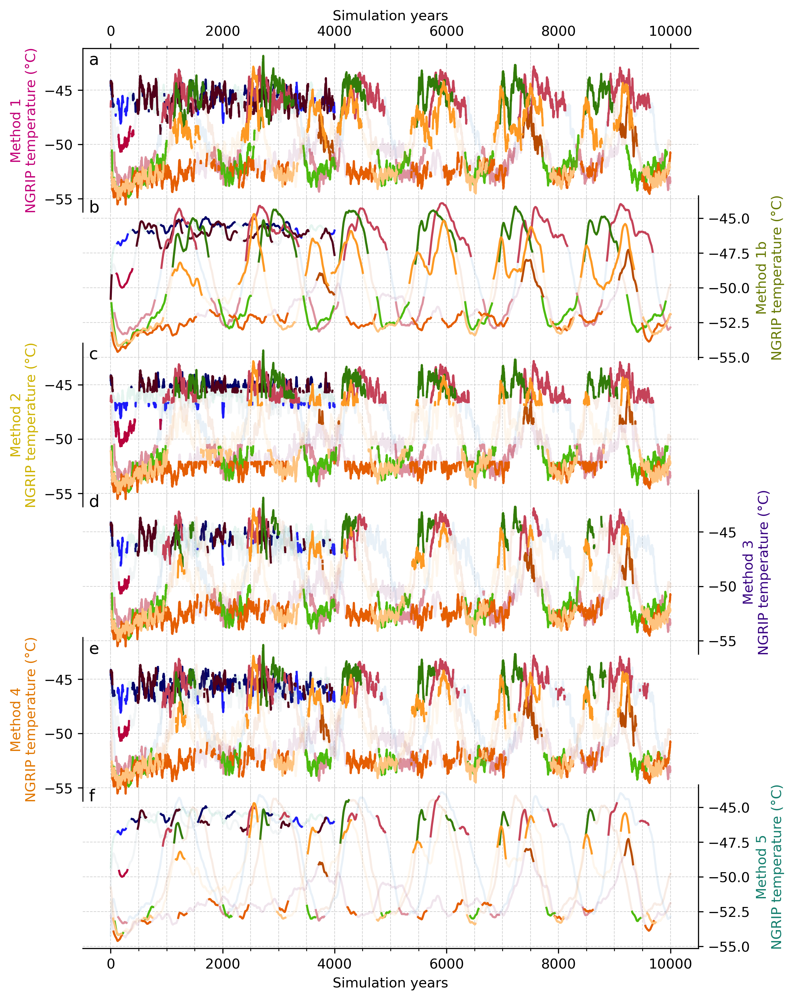

In [54]:
figMap = plt.figure(figsize=(8, 12), dpi=300, facecolor='None')

axNGRIP = {}

gs = figMap.add_gridspec(nrows=6, ncols=1, hspace=-0.1)
(axNGRIP['Method 1'], axNGRIP['Method 1b'], axNGRIP['Method 2'], axNGRIP['Method 3'], axNGRIP['Method 4'], axNGRIP['Method 5']) = gs.subplots(
    subplot_kw={'facecolor':'None'})

letter = 'a'

for expt in ['xoupd', 'xouph', 'tfgbi', 'xoupl', 'xoupf', 'tfgbj']:
    for method in ['Method 1', 'Method 2', 'Method 3', 'Method 4']:
        axNGRIP[method].plot(time[expt], ngripv[expt], color=colors[expt], linestyle="-", alpha=0.1)
        axNGRIP[method].plot(time[expt], ngripc[method][expt], color=colors_cold[expt], linestyle="-")
        axNGRIP[method].plot(time[expt], ngripw[method][expt], color=colors_warm[expt], linestyle="-", 
                            label=labels[expt])
    for method in ['Method 1b', 'Method 5']:
        axNGRIP[method].plot(time[expt], ngripf[expt], color=colors[expt], linestyle="-", alpha=0.1)
        axNGRIP[method].plot(time[expt], ngripc[method][expt], color=colors_cold[expt], linestyle="-")
        axNGRIP[method].plot(time[expt], ngripw[method][expt], color=colors_warm[expt], linestyle="-", 
                            label=labels[expt])
    
for method in ['Method 1', 'Method 2', 'Method 4']:
    axNGRIP[method].spines['right'].set_visible(False)
    axNGRIP[method].spines['top'].set_visible(False)
    axNGRIP[method].spines['bottom'].set_visible(False)

axNGRIP['Method 1'].spines['top'].set_visible(True)
axNGRIP['Method 1'].xaxis.set_ticks_position('top')
axNGRIP['Method 1'].xaxis.set_label_position('top')
axNGRIP['Method 1'].set_xlabel("Simulation years")

for method in ['Method 1b', 'Method 3', 'Method 5']:
    axNGRIP[method].spines['left'].set_visible(False)
    axNGRIP[method].spines['top'].set_visible(False)
    axNGRIP[method].spines['bottom'].set_visible(False)
    axNGRIP[method].yaxis.set_ticks_position('right')
    axNGRIP[method].yaxis.set_label_position('right')

axNGRIP['Method 5'].spines['bottom'].set_visible(True)
axNGRIP['Method 5'].set_xlabel("Simulation years")

for method in ['Method 1b', 'Method 2', 'Method 3', 'Method 4']:
    axNGRIP[method].tick_params(axis='x', colors='None', which="both")

for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
    axNGRIP[method].xaxis.set_minor_locator(AutoMinorLocator())
    axNGRIP[method].grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
    axNGRIP[method].set_ylabel(f"{method}\nNGRIP temperature (°C)", color=colors_method[method])
    axNGRIP[method].annotate(letter, xy=(0.01, 0.9), xycoords='axes fraction', size=12)
    letter = chr(ord(letter)+1)
        
axAMOC['Method 1'].legend(fontsize='small', loc="lower left", bbox_to_anchor=(1, 0.3, 1, 1))

In [55]:
# figMap.savefig('Figures/picking_ngrip.pdf', bbox_inches='tight', format='pdf')

### Figure S12 - Methods comparison for the oscillating simulations

In [56]:
cind, wind = {}, {}
amoc, sat, sst, mld, wice, sice = {}, {}, {}, {}, {}, {}
amoc_mode, sat_mode, sst_mode, mld_mode, wice_mode, sice_mode = {}, {}, {}, {}, {}, {}

amoc_ref = hcm3.MERIDATS('xoupa', chunks=10).atlantic(mode_z="max", mode_t='mean', zone=zones.Box(lat_min=-20, lat_max=80)).values()
sat_ref = hcm3.SATATS('xoupa', chunks=10).sat(mode_lon="mean", mode_t='mean', zone=plane_at).values()
sst_ref = hcm3.SSTATS('xoupa', chunks=10).sst(mode_lon="mean", mode_t='mean', zone=plane_at).values()
mld_ref = hcm3.MLDATS('xoupa', chunks=10).mld(mode_lon="mean", mode_t='mean', zone=plane_at).values()
wice_ref = hcm3.WICEATS('xoupa', chunks=10).ice_conc(mode_lon="mean", mode_t='mean', zone=plane_at).values()*100
sice_ref = hcm3.SICEATS('xoupa', chunks=10).ice_conc(mode_lon="mean", mode_t='mean', zone=plane_at).values()*100


for expt in ['tfgbi', 'tfgbj', 'xoupl']:
    cind[expt], wind[expt] = {}, {}
    amoc[expt], sat[expt], sst[expt], mld[expt], wice[expt], sice[expt] = {}, {}, {}, {}, {}, {}
    amoc_mode[expt], sat_mode[expt], sst_mode[expt], mld_mode[expt], wice_mode[expt], sice_mode[expt] = {}, {}, {}, {}, {}, {}

    for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
        cind[expt][method] = np.where(~np.isnan(amocc[method][expt]))
        wind[expt][method] = np.where(~np.isnan(amocw[method][expt]))

    if expt == 'xoupl':
        amoc[expt] = hcm3.MERIDATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.MERIDATS(expt, chunks=10)).atlantic(mode_z="max", zone=zones.Box(lat_min=-20, lat_max=80))
        sat[expt] = hcm3.SATATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.SATATS(expt, chunks=10)).sat(mode_lon="mean", zone=plane_at)
        sst[expt] = hcm3.SSTATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.SSTATS(expt, chunks=10)).sst(mode_lon="mean", zone=plane_at)
        mld[expt] = hcm3.MLDATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.MLDATS(expt, chunks=10)).mld(mode_lon="mean", zone=plane_at)
        wice[expt] = hcm3.WICEATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.WICEATS(expt, chunks=10)).ice_conc(mode_lon="mean", zone=plane_at)
        sice[expt] = hcm3.SICEATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.SICEATS(expt, chunks=10)).ice_conc(mode_lon="mean", zone=plane_at)
    else:
        amoc[expt] = hcm3.MERIDATS(expt, chunks=10).atlantic(mode_z="max", zone=zones.Box(lat_min=-20, lat_max=80))
        sat[expt] = hcm3.SATATS(expt, chunks=10).sat(mode_lon="mean", zone=plane_at)
        sst[expt] = hcm3.SSTATS(expt, chunks=10).sst(mode_lon="mean", zone=plane_at)
        mld[expt] = hcm3.MLDATS(expt, chunks=10).mld(mode_lon="mean", zone=plane_at)
        wice[expt] = hcm3.WICEATS(expt, chunks=10).ice_conc(mode_lon="mean", zone=plane_at)
        sice[expt] = hcm3.SICEATS(expt, chunks=10).ice_conc(mode_lon="mean", zone=plane_at)


    for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:
        amoc_mode[expt][method] = {}
        amoc_mode[expt][method]['Cold'] = np.nanmean(amoc[expt].values()[cind[expt][method]], axis=0)
        amoc_mode[expt][method]['Warm'] = np.nanmean(amoc[expt].values()[wind[expt][method]], axis=0)

        sst_mode[expt][method] = {}
        sst_mode[expt][method]['Cold'] = np.nanmean(sst[expt].values()[cind[expt][method]], axis=0)
        sst_mode[expt][method]['Warm'] = np.nanmean(sst[expt].values()[wind[expt][method]], axis=0)

        sat_mode[expt][method] = {}
        sat_mode[expt][method]['Cold'] = np.nanmean(sat[expt].values()[cind[expt][method]], axis=0)
        sat_mode[expt][method]['Warm'] = np.nanmean(sat[expt].values()[wind[expt][method]], axis=0)

        mld_mode[expt][method] = {}
        mld_mode[expt][method]['Cold'] = np.nanmean(mld[expt].values()[cind[expt][method]], axis=0)
        mld_mode[expt][method]['Warm'] = np.nanmean(mld[expt].values()[wind[expt][method]], axis=0)

        wice_mode[expt][method] = {}
        wice_mode[expt][method]['Cold'] = np.nanmean(wice[expt].values()[cind[expt][method]], axis=0)*100
        wice_mode[expt][method]['Warm'] = np.nanmean(wice[expt].values()[wind[expt][method]], axis=0)*100

        sice_mode[expt][method] = {}
        sice_mode[expt][method]['Cold'] = np.nanmean(sice[expt].values()[cind[expt][method]], axis=0)*100
        sice_mode[expt][method]['Warm'] = np.nanmean(sice[expt].values()[wind[expt][method]], axis=0)*100

__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupa between years 1 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ Processing z: max
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: mean
____ Processing t: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : xoupa between years 0 and 4999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SST.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: mean

<ipython-input-56-f5dee19da522>:56: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Cold'] = np.nanmean(wice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:57: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Warm'] = np.nanmean(wice[expt].values()[wind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:60: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Cold'] = np.nanmean(sice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:61: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Warm'] = np.nanmean(sice[expt].values()[wind[expt][method]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbj between years 1001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: mean
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SSTATS'> : tfgbj between years 1000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SST.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longitude: mean
____ Rebuilding the data_array
__ I

<ipython-input-56-f5dee19da522>:56: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Cold'] = np.nanmean(wice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:57: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Warm'] = np.nanmean(wice[expt].values()[wind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:60: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Cold'] = np.nanmean(sice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:61: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Warm'] = np.nanmean(sice[expt].values()[wind[expt][method]], axis=0)*100


__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : tfgbr between years 1001 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.MERIDATS'> : xoupl between years 4001 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing meridional Overturning Stream Function (Atlantic).
____ Coordinates imported in the GeoDataArray instance.
____ Processing z: max
____ Rebuilding the data_array
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : tfgbr between years 1000 and 3999.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importation of <class 'pylaeoclim_leeds.hadcm3_processing.SATATS'> : xoupl between years 4000 and 11000.
____ Import succeeded.
____ Coordinates imported in the HadCM3DS dataset.
__ Importing SAT.
____ Coordinates imported in the GeoDataArray instance.
____ Processing longit

<ipython-input-56-f5dee19da522>:56: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Cold'] = np.nanmean(wice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:57: RuntimeWarning: Mean of empty slice
  wice_mode[expt][method]['Warm'] = np.nanmean(wice[expt].values()[wind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:60: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Cold'] = np.nanmean(sice[expt].values()[cind[expt][method]], axis=0)*100
<ipython-input-56-f5dee19da522>:61: RuntimeWarning: Mean of empty slice
  sice_mode[expt][method]['Warm'] = np.nanmean(sice[expt].values()[wind[expt][method]], axis=0)*100


ValueError: x and y must have same first dimension, but have shapes (41,) and (40,)

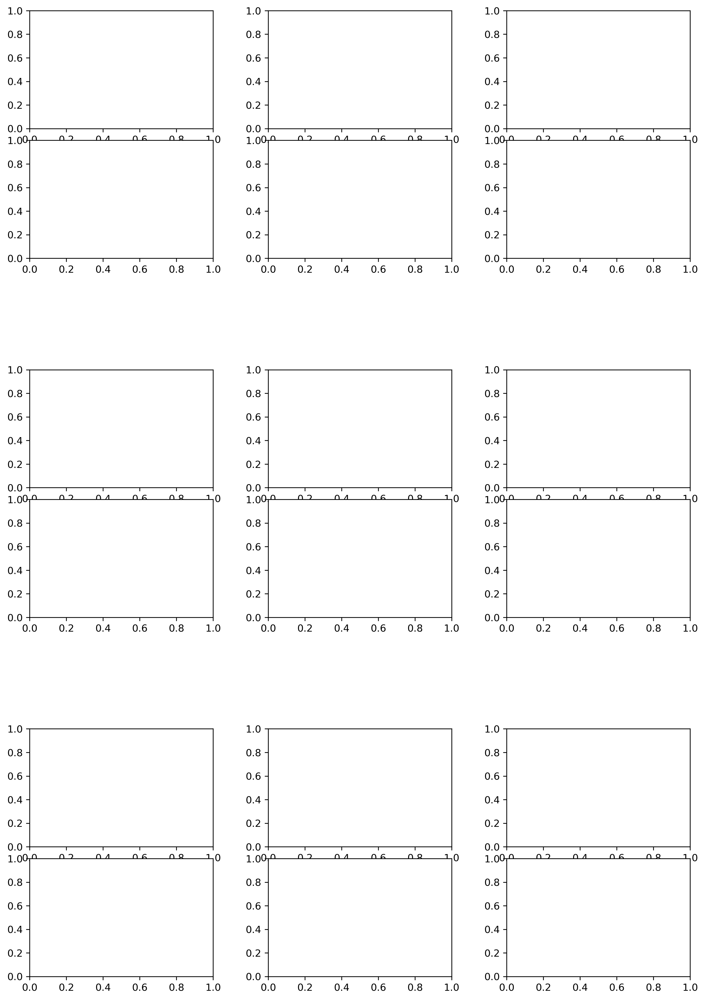

In [57]:
axSAT, axSST, axMLD, axWICE, axSICE, axAMOC = {}, {}, {}, {}, {}, {}

figMap = plt.figure(figsize=(12, 18), dpi=300, facecolor='None')

grid = figMap.add_gridspec(nrows=3, ncols=1, hspace=0.45)
gridExp = {}

gridExp['tfgbi'] = grid[0].subgridspec(nrows=2, ncols=3, wspace=0.3, hspace=0.1)
((axSAT['tfgbi'], axSST['tfgbi'], axMLD['tfgbi']), 
 (axWICE['tfgbi'], axSICE['tfgbi'], axAMOC['tfgbi'])) = gridExp['tfgbi'].subplots()
gridExp['tfgbj'] = grid[1].subgridspec(nrows=2, ncols=3, wspace=0.3, hspace=0.1)
((axSAT['tfgbj'], axSST['tfgbj'], axMLD['tfgbj']), 
 (axWICE['tfgbj'], axSICE['tfgbj'], axAMOC['tfgbj'])) = gridExp['tfgbj'].subplots()
gridExp['xoupl'] = grid[2].subgridspec(nrows=2, ncols=3, wspace=0.3, hspace=0.1)
((axSAT['xoupl'], axSST['xoupl'], axMLD['xoupl']), 
 (axWICE['xoupl'], axSICE['xoupl'], axAMOC['xoupl'])) = gridExp['xoupl'].subplots()

letter = 'a'

for expt in ['tfgbi', 'tfgbj', 'xoupl']:

    for method in ['Method 1', 'Method 1b', 'Method 2', 'Method 3', 'Method 4', 'Method 5']:

        axSAT[expt].plot(sat[expt].lat, sat_mode[expt][method]['Cold'] - sat_ref, linestyle='-', color=colors_method[method], label=method)
        axSAT[expt].plot(sat[expt].lat, sat_mode[expt][method]['Warm'] - sat_ref, linestyle='--', color=colors_method[method])

        axSST[expt].plot(sst[expt].lat, sst_mode[expt][method]['Cold'] - sst_ref, linestyle='-', color=colors_method[method], label=method)
        axSST[expt].plot(sst[expt].lat, sst_mode[expt][method]['Warm'] - sst_ref, linestyle='--', color=colors_method[method])

        axMLD[expt].plot(mld[expt].lat, mld_mode[expt][method]['Cold'] - mld_ref, linestyle='-', color=colors_method[method], label=method)
        axMLD[expt].plot(mld[expt].lat, sst_mode[expt][method]['Warm'] - mld_ref, linestyle='--', color=colors_method[method])

        axWICE[expt].plot(wice[expt].lat, wice_mode[expt][method]['Cold'] - wice_ref, linestyle='-', color=colors_method[method], label=method)
        axWICE[expt].plot(wice[expt].lat, wice_mode[expt][method]['Warm'] - wice_ref, linestyle='--', color=colors_method[method])

        axSICE[expt].plot(sice[expt].lat, sice_mode[expt][method]['Cold'] - sice_ref, linestyle='-', color=colors_method[method], label=method)
        axSICE[expt].plot(sice[expt].lat, sice_mode[expt][method]['Warm'] - sice_ref, linestyle='--', color=colors_method[method])

        axAMOC[expt].plot(amoc[expt].lat, amoc_mode[expt][method]['Cold'] - amoc_ref, linestyle='-', color=colors_method[method], label=method)
        axAMOC[expt].plot(amoc[expt].lat, amoc_mode[expt][method]['Warm'] - amoc_ref, linestyle='--', color=colors_method[method])

    axSAT[expt].set_ylabel("Surface Air\nTemperature (°C)", fontsize='medium')
    axSST[expt].set_ylabel("Sea Surface\n Temperature (°C)", fontsize='medium')
    axMLD[expt].set_ylabel("Mixed Layer Depth (m)")
    axWICE[expt].set_ylabel("Winter sea ice (%)")
    axSICE[expt].set_ylabel("Summer sea ice (%)")
    axAMOC[expt].set_ylabel("Maximum AMOC (Sv)")
    
    for ax in (axSAT[expt], axSST[expt], axMLD[expt], axWICE[expt], axSICE[expt], axAMOC[expt]):
        ax.axhline(y=0, color='k')
        ax.set_xlabel("Latitude (° N)")
        ax.set_xlim([-20,80])
        
        ax.spines['right'].set_visible(False)
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')

        ax.annotate(letter, xy=(0.05,0.035), xycoords='axes fraction', size=15)
        letter = chr(ord(letter)+1)
        
    for ax in (axSAT[expt], axSST[expt], axMLD[expt]):
        ax.spines['bottom'].set_visible(False)
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')

    for ax in (axWICE[expt], axSICE[expt], axAMOC[expt]):
        ax.spines['top'].set_visible(False)
        ax.xaxis.set_ticks_position('bottom')
        ax.xaxis.set_label_position('bottom')
        
    axSST[expt].annotate(f"{labels[expt]}", xy=(0.5,1.35), xycoords='axes fraction', va='center',
                         fontsize='x-large', color=colors[expt])
    axSICE[expt].legend(fontsize='medium', loc='lower left', bbox_to_anchor=(0, 0.2, 1,1))

In [ ]:
figMap.savefig('Figures/picking_experiments.pdf', bbox_inches='tight', format='pdf')

## Reviews

### AMOC indexes

In [ ]:
amoc, amoc1, amoc2, amoc3 = {}, {}, {}, {}

for expt in expts:
    
    if expt=='xoupl':
        ts = hcm3.MERIDATS('tfgbr', end_year=3999, chunks=10).concat(hcm3.MERIDATS('xoupl', chunks=10))
    elif expt=='xoupd':
        ts = hcm3.MERIDATS('tfgbd', end_year=4060, chunks=10).concat(hcm3.MERIDATS('xoupd', chunks=10))
    else:
        ts = hcm3.MERIDATS(expt, chunks=10)
    
    amoc[expt]=ts.atlantic(mode_lat="value", value_lat=26.5, mode_z="max")
    # Zhang 2014
    amoc1[expt]=ts.atlantic(zone=zones.Box(lat_min=45), mode_lat="max", mode_z="max")
    # Ivanovic 2018
    amoc2[expt]=ts.atlantic(zone=zones.Box(lat_min=19, lat_max=81, z_max=-200), mode_lat="max", mode_z="max")
    # Armstrong 2022
    amoc3[expt]=ts.atlantic(zone=zones.Box(lat_min=40, lat_max=50), mode_lat="mean", mode_z="mean")


In [ ]:
figMap = plt.figure(figsize=(6, 6), dpi=200)

gs = gridspec.GridSpec(nrows=4, ncols=1, hspace=0)
axAMOC = figMap.add_subplot(gs[0],facecolor='None')
axAMOC1 = figMap.add_subplot(gs[1],facecolor='None', sharex=axAMOC)
axAMOC2 = figMap.add_subplot(gs[2],facecolor='None', sharex=axAMOC)
axAMOC3 = figMap.add_subplot(gs[3],facecolor='None', sharex=axAMOC)

for expt in expts:
    
    start = 1000 if expt == 'xoupa' else 0
    
    axAMOC.plot(amoc[expt].processed_time(start_dates[expt])[start:], amoc[expt].values()[start:], color=colors[expt], linestyle="-", alpha=0.1)
    axAMOC.plot(amoc[expt].processed_time(start_dates[expt])[start:], util.rmean(amoc[expt].values()[start:], 30), color=colors[expt], linestyle="-")

    axAMOC1.plot(amoc1[expt].processed_time(start_dates[expt])[start:], amoc1[expt].values()[start:], color=colors[expt], linestyle="-", alpha=0.1)
    axAMOC1.plot(amoc1[expt].processed_time(start_dates[expt])[start:], util.rmean(amoc1[expt].values()[start:], 30), color=colors[expt], linestyle="-")

    axAMOC2.plot(amoc2[expt].processed_time(start_dates[expt])[start:], amoc2[expt].values()[start:], color=colors[expt], linestyle="-", alpha=0.1)
    axAMOC2.plot(amoc2[expt].processed_time(start_dates[expt])[start:], util.rmean(amoc2[expt].values()[start:], 30), color=colors[expt], linestyle="-")

    axAMOC3.plot(amoc3[expt].processed_time(start_dates[expt])[start:], amoc3[expt].values()[start:], color=colors[expt], linestyle="-", alpha=0.1)
    axAMOC3.plot(amoc3[expt].processed_time(start_dates[expt])[start:], util.rmean(amoc3[expt].values()[start:], 30), color=colors[expt], linestyle="-")
    
axAMOC.set_ylabel('Max AMOC at 26.5°N (Sv)')
axAMOC.set_xlabel('Simulation years')
axAMOC.spines['right'].set_visible(False)
axAMOC.spines['bottom'].set_visible(False)
axAMOC.yaxis.set_ticks_position('left')
axAMOC.yaxis.set_label_position('left')
axAMOC.xaxis.set_ticks_position('top')
axAMOC.xaxis.set_label_position('top')
axAMOC.xaxis.set_minor_locator(AutoMinorLocator())
axAMOC.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axAMOC1.set_ylabel('Alternative AMOC index 1 (Sv)')
axAMOC1.spines['left'].set_visible(False)
axAMOC1.spines['bottom'].set_visible(False)
axAMOC1.spines['top'].set_visible(False)
axAMOC1.yaxis.set_ticks_position('right')
axAMOC1.yaxis.set_label_position('right')
axAMOC1.tick_params(axis='x', colors='None', which='both')
axAMOC1.xaxis.set_minor_locator(AutoMinorLocator())
axAMOC1.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axAMOC2.set_ylabel('Alternative AMOC index 2 (Sv)')
axAMOC2.spines['right'].set_visible(False)
axAMOC2.spines['bottom'].set_visible(False)
axAMOC2.spines['top'].set_visible(False)
axAMOC2.yaxis.set_ticks_position('left')
axAMOC2.yaxis.set_label_position('left')
axAMOC2.tick_params(axis='x', colors='None', which='both')
axAMOC2.xaxis.set_minor_locator(AutoMinorLocator())
axAMOC2.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axAMOC3.set_ylabel('Alternative AMOC index 3 (Sv)')
axAMOC3.spines['left'].set_visible(False)
axAMOC3.spines['top'].set_visible(False)
axAMOC3.yaxis.set_ticks_position('right')
axAMOC3.yaxis.set_label_position('right')
axAMOC3.xaxis.set_minor_locator(AutoMinorLocator())
axAMOC3.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)

axAMOC.annotate('a', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axAMOC2.annotate('b', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axAMOC2.annotate('c', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axAMOC3.annotate('d', xy=(0.01,0.85), xycoords='axes fraction', size=12)